In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/consumer-behavior-and-shopping-habits-dataset/shopping_behavior_updated.csv
/kaggle/input/consumer-behavior-and-shopping-habits-dataset/shopping_trends.csv


In [2]:
!pip install kmodes 

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns

import statsmodels.api as sm

%matplotlib inline

In [4]:
from sklearn.preprocessing import LabelEncoder, StandardScaler, MinMaxScaler, OrdinalEncoder
from sklearn.impute import SimpleImputer

In [5]:
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import RandomOverSampler
from sklearn.feature_selection import SelectKBest, chi2

In [6]:
from sklearn.cluster import KMeans, AgglomerativeClustering, Birch
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA
from kmodes.kmodes import KModes
from kmodes.kprototypes import KPrototypes

In [7]:
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score

In [8]:
import warnings

with warnings.catch_warnings():
    warnings.simplefilter("ignore", category=FutureWarning)

In [9]:
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/consumer-behavior-and-shopping-habits-dataset/shopping_behavior_updated.csv
/kaggle/input/consumer-behavior-and-shopping-habits-dataset/shopping_trends.csv


In [10]:
filepath = '/kaggle/input/consumer-behavior-and-shopping-habits-dataset/shopping_behavior_updated.csv'

data = pd.read_csv(filepath, delimiter=',')

In [11]:
data.head(10)

,Customer ID,Age,Gender,Item Purchased,Category,Purchase Amount (USD),Location,Size,Color,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,Promo Code Used,Previous Purchases,Payment Method,Frequency of Purchases
0,1,55,Male,Blouse,Clothing,53,Kentucky,L,Gray,Winter,3.1,Yes,Express,Yes,Yes,14,Venmo,Fortnightly
1,2,19,Male,Sweater,Clothing,64,Maine,L,Maroon,Winter,3.1,Yes,Express,Yes,Yes,2,Cash,Fortnightly
2,3,50,Male,Jeans,Clothing,73,Massachusetts,S,Maroon,Spring,3.1,Yes,Free Shipping,Yes,Yes,23,Credit Card,Weekly
3,4,21,Male,Sandals,Footwear,90,Rhode Island,M,Maroon,Spring,3.5,Yes,Next Day Air,Yes,Yes,49,PayPal,Weekly
4,5,45,Male,Blouse,Clothing,49,Oregon,M,Turquoise,Spring,2.7,Yes,Free Shipping,Yes,Yes,31,PayPal,Annually
5,6,46,Male,Sneakers,Footwear,20,Wyoming,M,White,Summer,2.9,Yes,Standard,Yes,Yes,14,Venmo,Weekly
6,7,63,Male,Shirt,Clothing,85,Montana,M,Gray,Fall,3.2,Yes,Free Shipping,Yes,Yes,49,Cash,Quarterly
7,8,27,Male,Shorts,Clothing,34,Louisiana,L,Charcoal,Winter,3.2,Yes,Free Shipping,Yes,Yes,19,Credit Card,Weekly
8,9,26,Male,Coat,Outerwear,97,West Virginia,L,Silver,Summer,2.6,Yes,Express,Yes,Yes,8,Venmo,Annually
9,10,57,Male,Handbag,Accessories,31,Missouri,M,Pink,Spring,4.8,Yes,2-Day Shipping,Yes,Yes,4,Cash,Quarterly


In [12]:
data.tail(10)

,Customer ID,Age,Gender,Item Purchased,Category,Purchase Amount (USD),Location,Size,Color,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,Promo Code Used,Previous Purchases,Payment Method,Frequency of Purchases
3890,3891,35,Female,Shirt,Clothing,81,Nebraska,XL,Green,Winter,2.6,No,Standard,No,No,33,Debit Card,Annually
3891,3892,36,Female,Dress,Clothing,30,Colorado,L,Peach,Winter,4.7,No,Free Shipping,No,No,6,Bank Transfer,Quarterly
3892,3893,35,Female,Jewelry,Accessories,86,Michigan,L,Indigo,Summer,3.5,No,Standard,No,No,5,PayPal,Fortnightly
3893,3894,21,Female,Hat,Accessories,64,Massachusetts,L,White,Fall,3.3,No,Store Pickup,No,No,29,Bank Transfer,Bi-Weekly
3894,3895,66,Female,Skirt,Clothing,78,Connecticut,L,White,Spring,3.9,No,2-Day Shipping,No,No,44,Credit Card,Every 3 Months
3895,3896,40,Female,Hoodie,Clothing,28,Virginia,L,Turquoise,Summer,4.2,No,2-Day Shipping,No,No,32,Venmo,Weekly
3896,3897,52,Female,Backpack,Accessories,49,Iowa,L,White,Spring,4.5,No,Store Pickup,No,No,41,Bank Transfer,Bi-Weekly
3897,3898,46,Female,Belt,Accessories,33,New Jersey,L,Green,Spring,2.9,No,Standard,No,No,24,Venmo,Quarterly
3898,3899,44,Female,Shoes,Footwear,77,Minnesota,S,Brown,Summer,3.8,No,Express,No,No,24,Venmo,Weekly
3899,3900,52,Female,Handbag,Accessories,81,California,M,Beige,Spring,3.1,No,Store Pickup,No,No,33,Venmo,Quarterly


In [13]:
data.shape

(3900, 18)

In [14]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3900 entries, 0 to 3899
Data columns (total 18 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Customer ID             3900 non-null   int64  
 1   Age                     3900 non-null   int64  
 2   Gender                  3900 non-null   object 
 3   Item Purchased          3900 non-null   object 
 4   Category                3900 non-null   object 
 5   Purchase Amount (USD)   3900 non-null   int64  
 6   Location                3900 non-null   object 
 7   Size                    3900 non-null   object 
 8   Color                   3900 non-null   object 
 9   Season                  3900 non-null   object 
 10  Review Rating           3900 non-null   float64
 11  Subscription Status     3900 non-null   object 
 12  Shipping Type           3900 non-null   object 
 13  Discount Applied        3900 non-null   object 
 14  Promo Code Used         3900 non-null   

In [15]:
data.describe()

,Customer ID,Age,Purchase Amount (USD),Review Rating,Previous Purchases
count,3900.000000,3900.000000,3900.000000,3900.000000,3900.000000
mean,1950.500000,44.068462,59.764359,3.749949,25.351538
std,1125.977353,15.207589,23.685392,0.716223,14.447125
min,1.000000,18.000000,20.000000,2.500000,1.000000
25%,975.750000,31.000000,39.000000,3.100000,13.000000
50%,1950.500000,44.000000,60.000000,3.700000,25.000000
75%,2925.250000,57.000000,81.000000,4.400000,38.000000
max,3900.000000,70.000000,100.000000,5.000000,50.000000


In [16]:
def show_value_count(data, label):
  value_count = data[label].value_counts()

  print(f"\nColumns {label}: \n{value_count}")

In [17]:
column_types = data.dtypes
object_columns = column_types[column_types == 'object'].index.tolist()

object_columns

['Gender',
 'Item Purchased',
 'Category',
 'Location',
 'Size',
 'Color',
 'Season',
 'Subscription Status',
 'Shipping Type',
 'Discount Applied',
 'Promo Code Used',
 'Payment Method',
 'Frequency of Purchases']

In [18]:
integer_columns = column_types[column_types == 'int64'].index.tolist()

integer_columns

['Customer ID', 'Age', 'Purchase Amount (USD)', 'Previous Purchases']

In [19]:
float_columns = column_types[column_types == 'float64'].index.tolist()

float_columns

['Review Rating']

In [20]:
for column in object_columns:
  show_value_count(data, column)


Columns Gender: 
Gender
Male      2652
Female    1248
Name: count, dtype: int64

Columns Item Purchased: 
Item Purchased
Blouse        171
Jewelry       171
Pants         171
Shirt         169
Dress         166
Sweater       164
Jacket        163
Belt          161
Sunglasses    161
Coat          161
Sandals       160
Socks         159
Skirt         158
Shorts        157
Scarf         157
Hat           154
Handbag       153
Hoodie        151
Shoes         150
T-shirt       147
Sneakers      145
Boots         144
Backpack      143
Gloves        140
Jeans         124
Name: count, dtype: int64

Columns Category: 
Category
Clothing       1737
Accessories    1240
Footwear        599
Outerwear       324
Name: count, dtype: int64

Columns Location: 
Location
Montana           96
California        95
Idaho             93
Illinois          92
Alabama           89
Minnesota         88
Nebraska          87
New York          87
Nevada            87
Maryland          86
Delaware          86
Vermont

In [21]:
for column in float_columns:
  show_value_count(data, column)


Columns Review Rating: 
Review Rating
3.4    182
4.0    181
4.6    174
4.2    171
2.9    170
4.9    166
3.9    163
3.0    162
2.6    159
4.4    158
3.1    157
3.7    156
3.5    156
2.7    154
3.3    152
3.2    152
3.6    149
4.7    148
4.1    148
4.3    147
4.8    144
3.8    142
4.5    139
2.8    136
5.0     68
2.5     66
Name: count, dtype: int64


In [22]:
for column in integer_columns:
  show_value_count(data, column)


Columns Customer ID: 
Customer ID
1       1
2621    1
2593    1
2594    1
2595    1
       ..
1305    1
1306    1
1307    1
1308    1
3900    1
Name: count, Length: 3900, dtype: int64

Columns Age: 
Age
69    88
57    87
41    86
25    85
49    84
50    83
54    83
27    83
62    83
32    82
19    81
58    81
42    80
43    79
28    79
31    79
37    77
46    76
29    76
68    75
59    75
63    75
56    74
36    74
55    73
52    73
64    73
35    72
51    72
65    72
40    72
45    72
47    71
66    71
30    71
23    71
38    70
53    70
18    69
21    69
26    69
34    68
48    68
24    68
39    68
70    67
22    66
61    65
60    65
33    63
20    62
67    54
44    51
Name: count, dtype: int64

Columns Purchase Amount (USD): 
Purchase Amount (USD)
94     62
32     62
36     62
51     61
90     60
       ..
100    36
87     35
49     35
69     34
61     33
Name: count, Length: 81, dtype: int64

Columns Previous Purchases: 
Previous Purchases
31    97
21    96
14    92
24    91
3    

In [23]:
data.isna().sum()

Customer ID               0
Age                       0
Gender                    0
Item Purchased            0
Category                  0
Purchase Amount (USD)     0
Location                  0
Size                      0
Color                     0
Season                    0
Review Rating             0
Subscription Status       0
Shipping Type             0
Discount Applied          0
Promo Code Used           0
Previous Purchases        0
Payment Method            0
Frequency of Purchases    0
dtype: int64

In [24]:
data.duplicated().sum()

0

In [25]:
duplicate_without_id = (data.drop(columns=["Customer ID"]))
duplicate_without_id.duplicated().sum()

0

In [26]:
data[data.duplicated()]

,Customer ID,Age,Gender,Item Purchased,Category,Purchase Amount (USD),Location,Size,Color,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,Promo Code Used,Previous Purchases,Payment Method,Frequency of Purchases


In [27]:
duplicate_without_id[duplicate_without_id.duplicated()]

,Age,Gender,Item Purchased,Category,Purchase Amount (USD),Location,Size,Color,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,Promo Code Used,Previous Purchases,Payment Method,Frequency of Purchases


In [28]:
num_data = data.filter(integer_columns+float_columns).drop("Customer ID", axis=1)
num_data.head()

,Age,Purchase Amount (USD),Previous Purchases,Review Rating
0,55,53,14,3.1
1,19,64,2,3.1
2,50,73,23,3.1
3,21,90,49,3.5
4,45,49,31,2.7


In [29]:
regions = {
    'New England': ['Connecticut', 'Maine', 'Massachusetts', 'New Hampshire', 'Rhode Island', 'Vermont'],
    'Mideast': ['Delaware', 'District of Columbia', 'Maryland', 'New Jersey', 'New York', 'Pennsylvania'],
    'Great Lakes': ['Illinois', 'Indiana', 'Michigan', 'Ohio', 'Wisconsin'],
    'Plains': ['Iowa', 'Kansas', 'Minnesota', 'Missouri', 'Nebraska', 'North Dakota', 'South Dakota'],
    'Southeast': ['Alabama', 'Arkansas', 'Florida', 'Georgia', 'Kentucky', 'Louisiana', 'Mississippi', 'North Carolina', 'South Carolina', 'Tennessee', 'Virginia', 'West Virginia'],
    'Southwest': ['Arizona', 'New Mexico', 'Oklahoma', 'Texas'],
    'Rocky Mountain': ['Colorado', 'Idaho', 'Montana', 'Utah', 'Wyoming'],
    'Far West': ['Alaska', 'California', 'Hawaii', 'Nevada', 'Oregon', 'Washington']
}

In [30]:
def get_region(state):
    for region, states in regions.items():
        if state in states:
            return region
    return 'Unknown'

In [31]:
data['Region'] = data['Location'].apply(get_region)

data['Region']

0         Southeast
1       New England
2       New England
3       New England
4          Far West
           ...     
3895      Southeast
3896         Plains
3897        Mideast
3898         Plains
3899       Far West
Name: Region, Length: 3900, dtype: object

In [32]:
data['Region'].value_counts()

Region
Southeast         947
Plains            541
Far West          466
New England       446
Rocky Mountain    406
Mideast           400
Great Lakes       396
Southwest         298
Name: count, dtype: int64

In [33]:
def classify_birth_year_group(age):
  birth_year = 2024 - age
  if birth_year >= 2013:
      return 'Gen_Alpha'
  elif 1995 <= birth_year <= 2012:
      return 'Gen_Z'
  elif 1980 <= birth_year <= 1994:
      return 'Millenials'
  elif 1965 <= birth_year <= 1979:
      return 'Gen_X'
  else:
      return 'Baby_Boomer'

data['Generation'] = data['Age'].apply(classify_birth_year_group)
data['Generation']

0            Gen_X
1            Gen_Z
2            Gen_X
3            Gen_Z
4            Gen_X
           ...    
3895    Millenials
3896         Gen_X
3897         Gen_X
3898    Millenials
3899         Gen_X
Name: Generation, Length: 3900, dtype: object

In [34]:
data['Generation'].value_counts()

Generation
Gen_X          1142
Millenials     1092
Gen_Z           878
Baby_Boomer     788
Name: count, dtype: int64

In [35]:
column_types = data.dtypes
object_columns = column_types[column_types == 'object'].index.tolist()
object_columns

['Gender',
 'Item Purchased',
 'Category',
 'Location',
 'Size',
 'Color',
 'Season',
 'Subscription Status',
 'Shipping Type',
 'Discount Applied',
 'Promo Code Used',
 'Payment Method',
 'Frequency of Purchases',
 'Region',
 'Generation']

In [36]:
integer_columns = column_types[column_types == 'int64'].index.tolist()
integer_columns

['Customer ID', 'Age', 'Purchase Amount (USD)', 'Previous Purchases']

In [37]:
float_columns = column_types[column_types == 'float64'].index.tolist()
float_columns

['Review Rating']

In [38]:
def boxplot_of_purchase(obj_column, title=""):
    for int_column in num_data:
      plt.figure(figsize=(12, 8))
      sns.set(style="darkgrid")
      ax = sns.boxplot(y=obj_column, x=int_column, data=data, palette="Set1")
      plt.title(int_column+" Distribution "+title, fontsize=16)
      plt.show()


def boxplot_of_purchase_hue(obj_column, hue='Gender', title=""):
    for int_column in num_data:
        plt.figure(figsize=(12, 8))
        sns.set(style="darkgrid")
        ax = sns.boxplot(y=obj_column, x=int_column, data=data, hue=hue, palette="Set1")
        plt.title(int_column+" Distribution "+title, fontsize=16)
        plt.show()

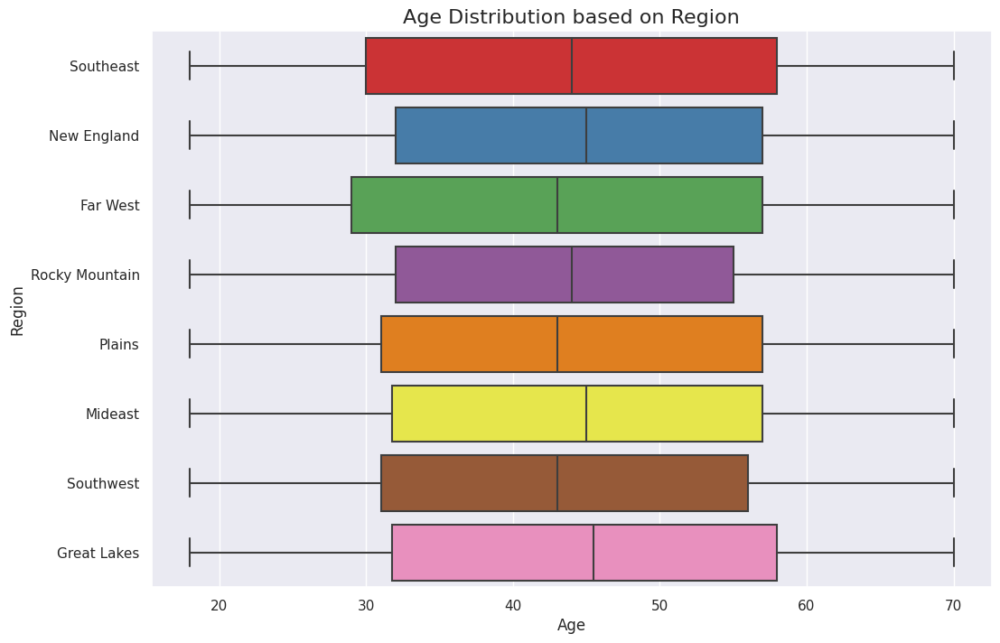

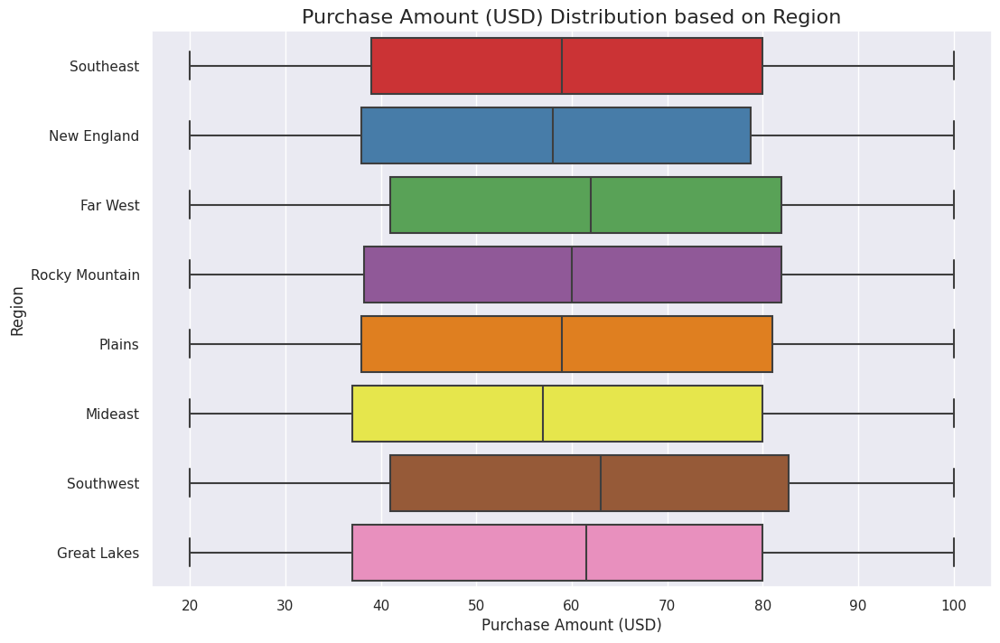

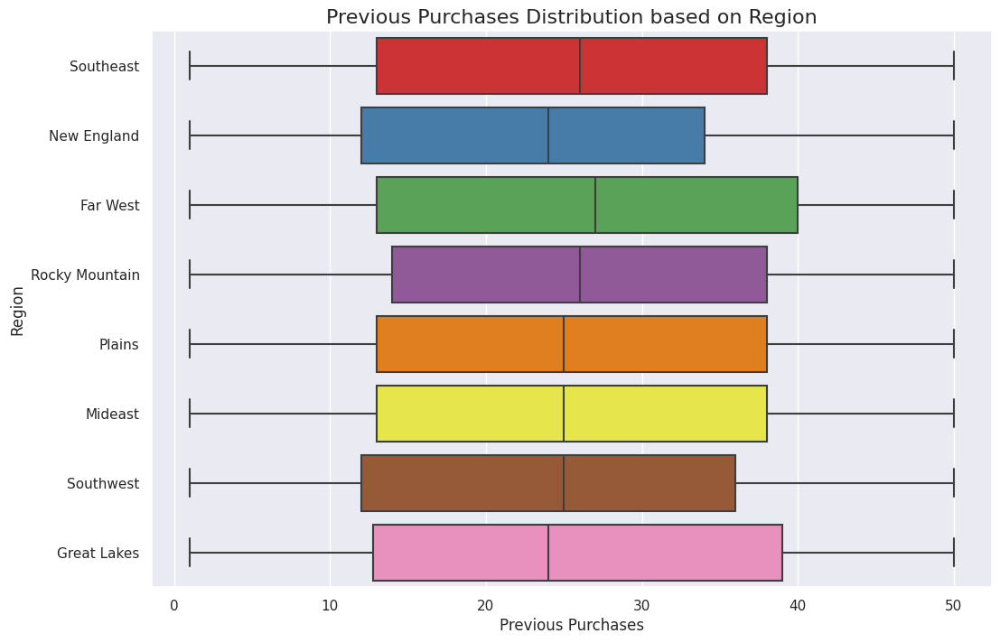

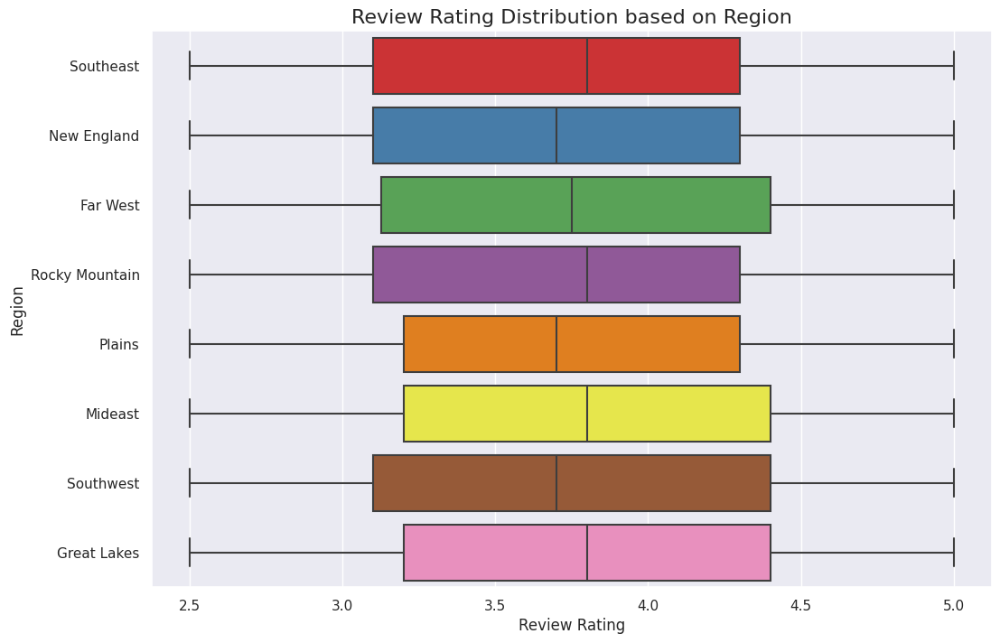

In [39]:
boxplot_of_purchase("Region", title="based on Region")

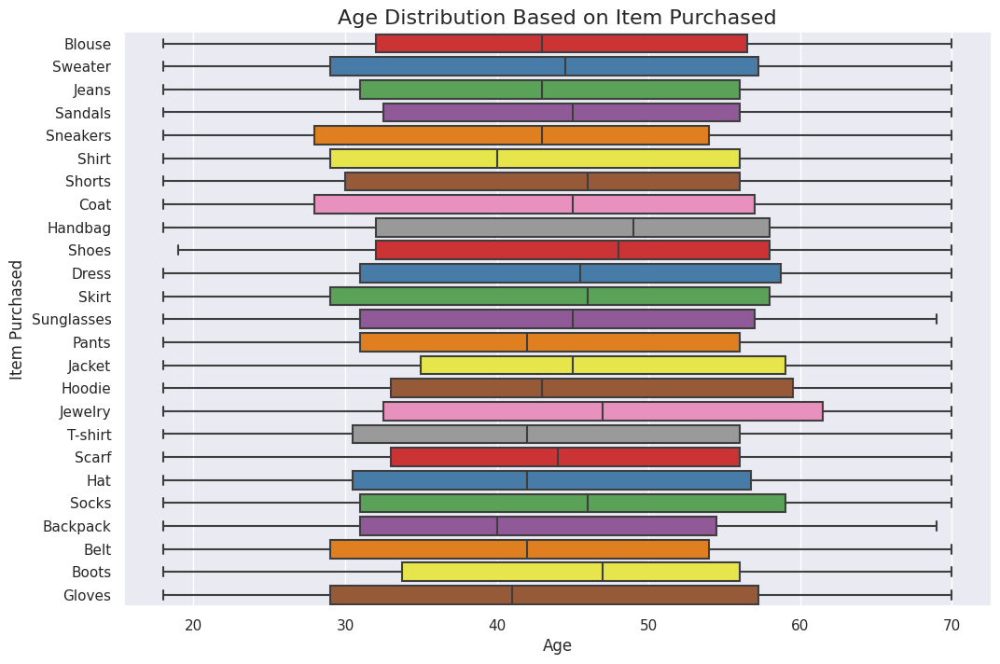

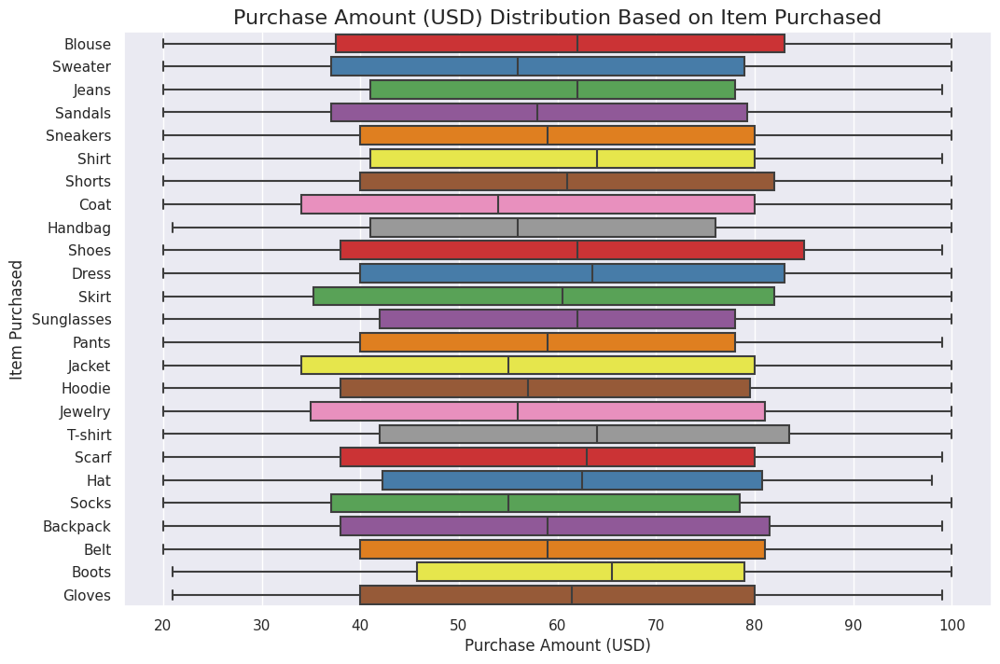

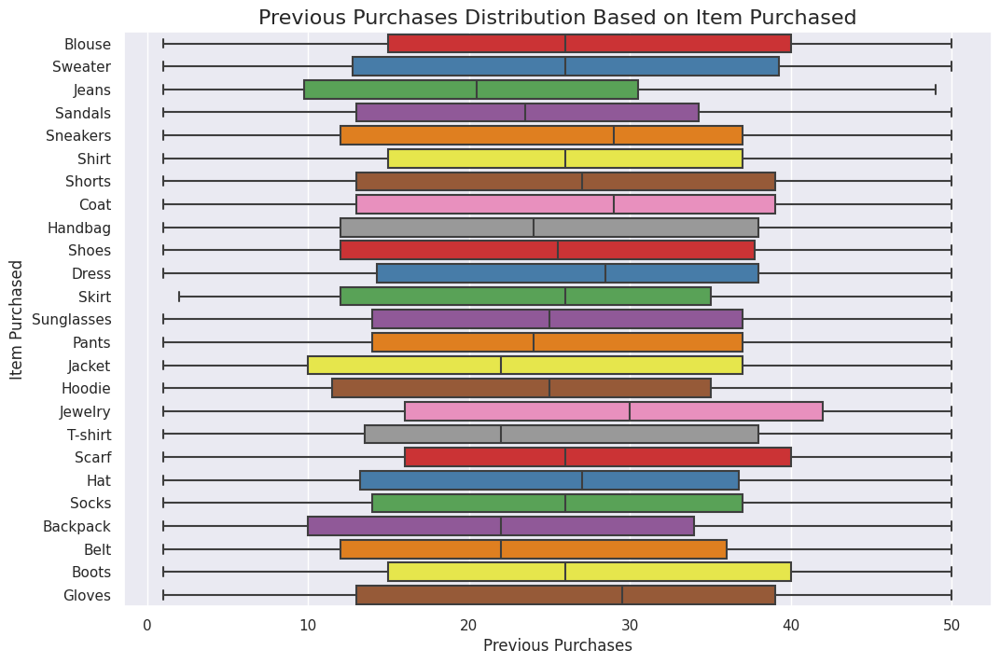

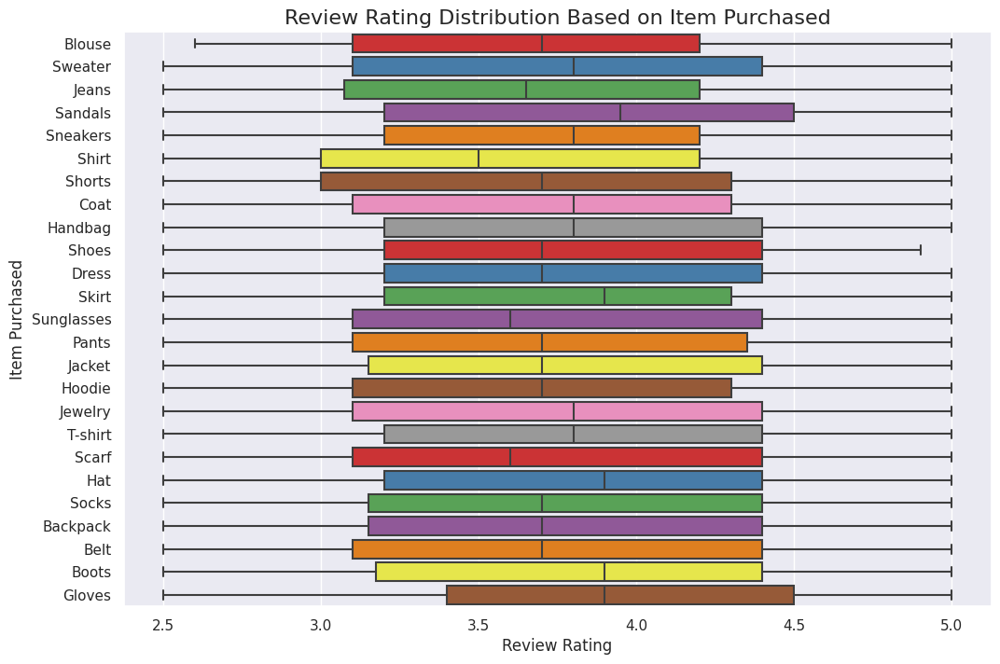

In [40]:
boxplot_of_purchase("Item Purchased", title="Based on Item Purchased")

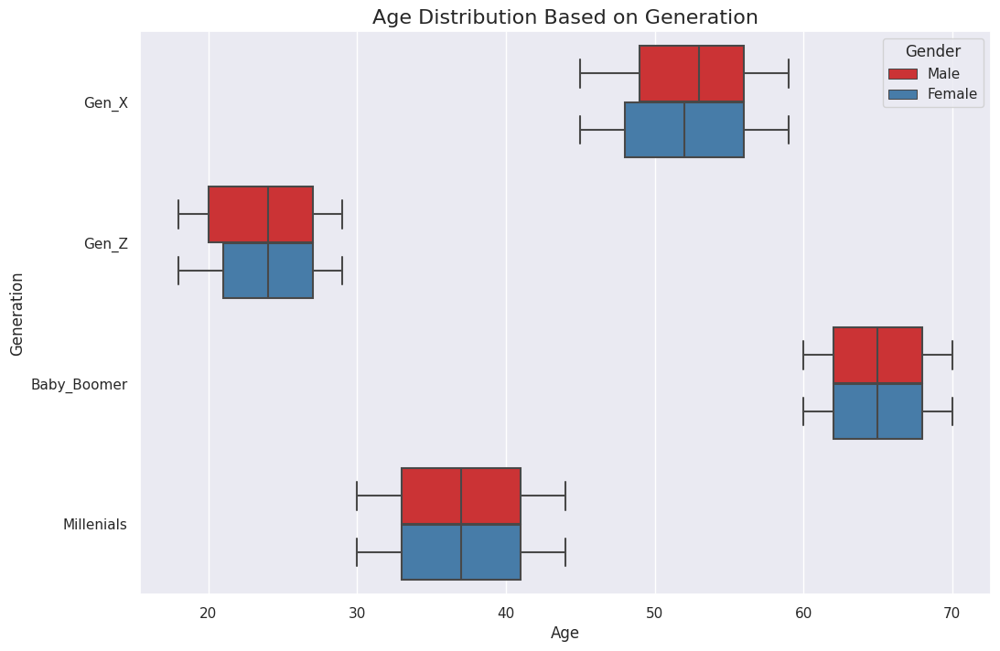

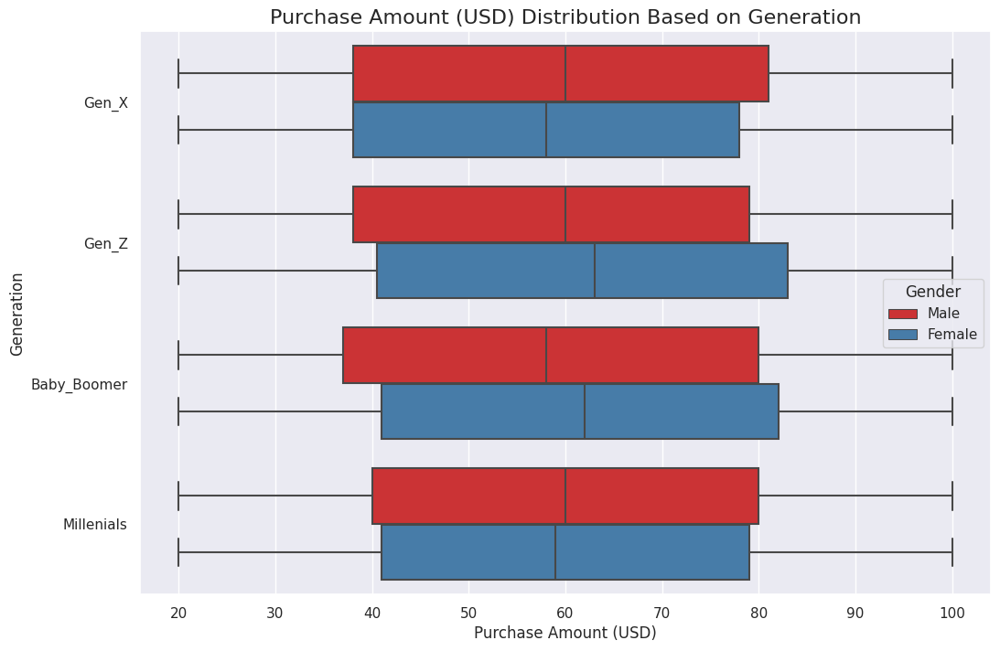

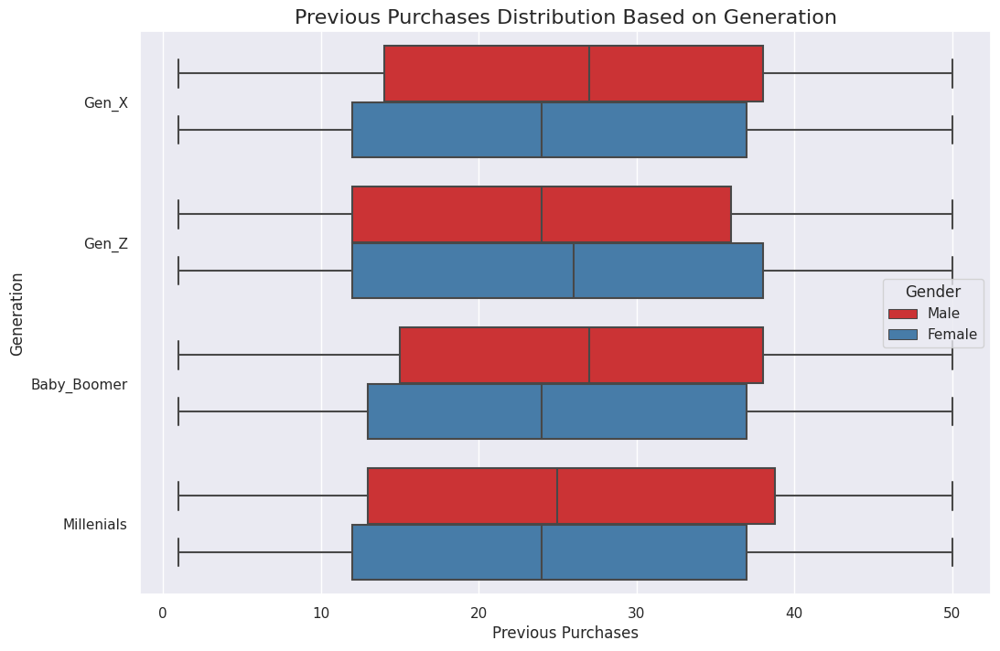

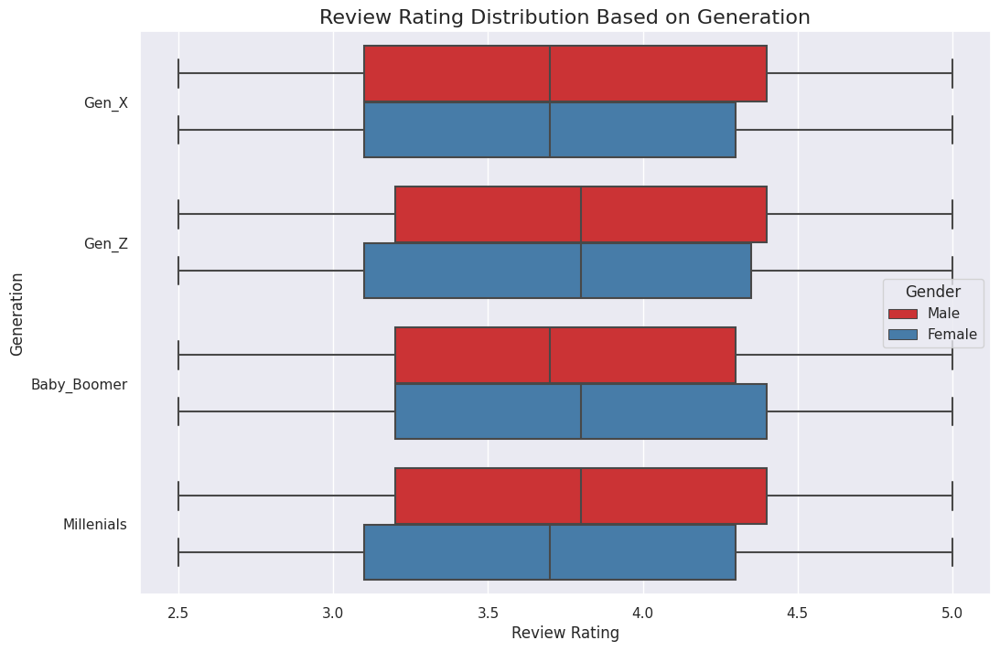

In [41]:
for column in ["Generation"]:
    boxplot_of_purchase_hue("Generation", 'Gender', title="Based on Generation")

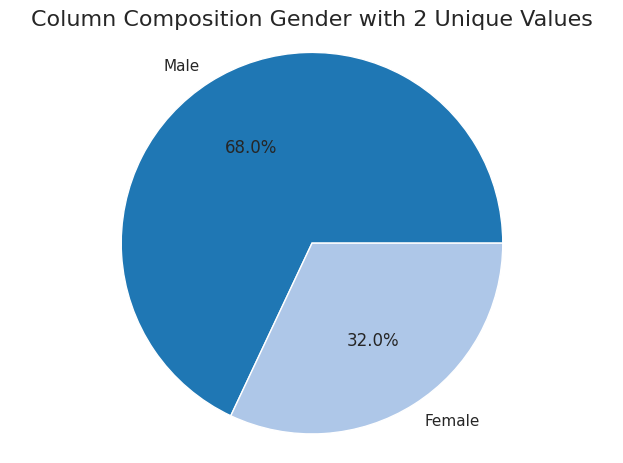

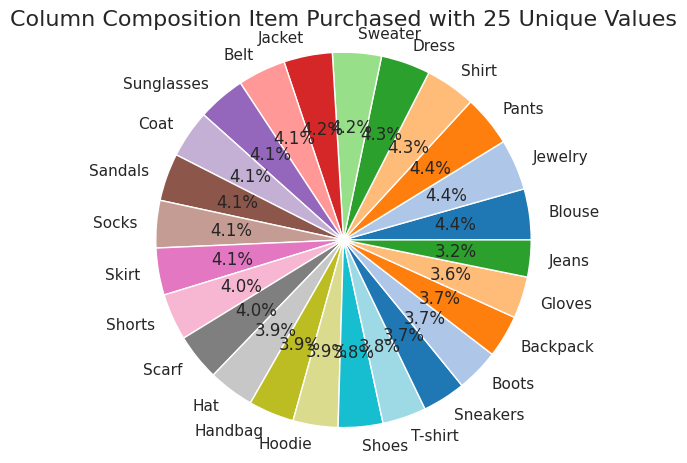

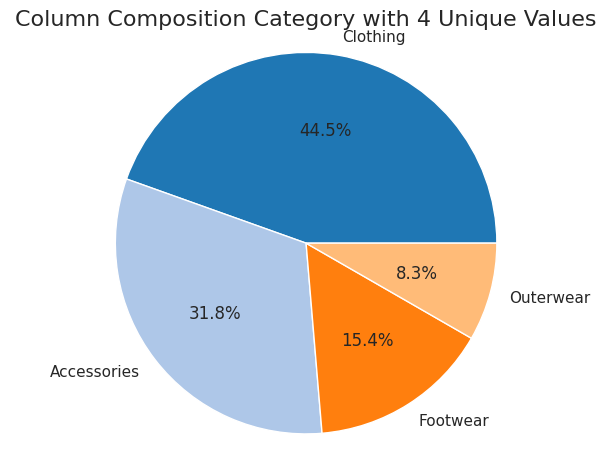

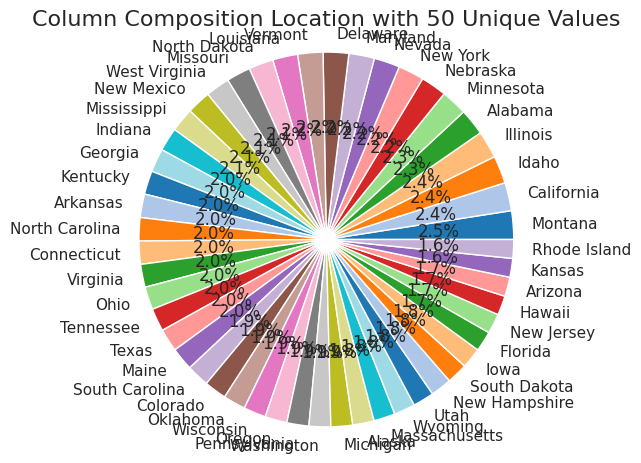

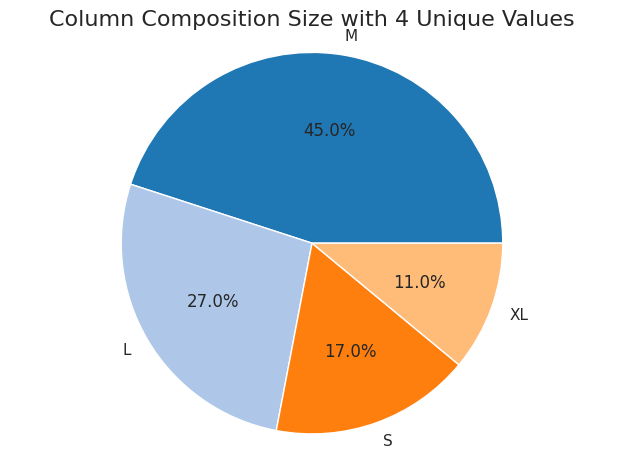

...

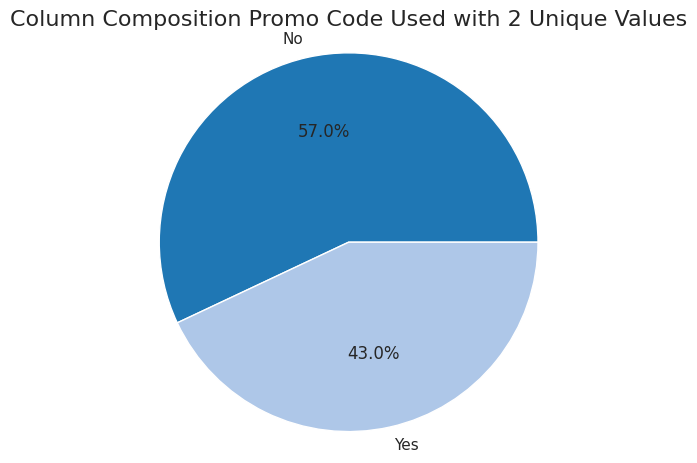

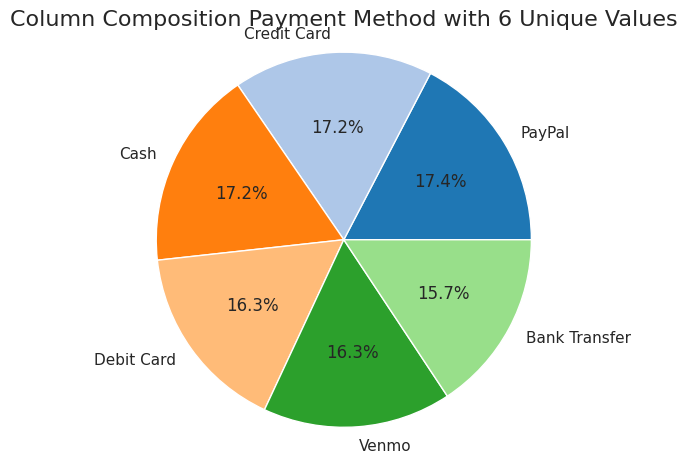

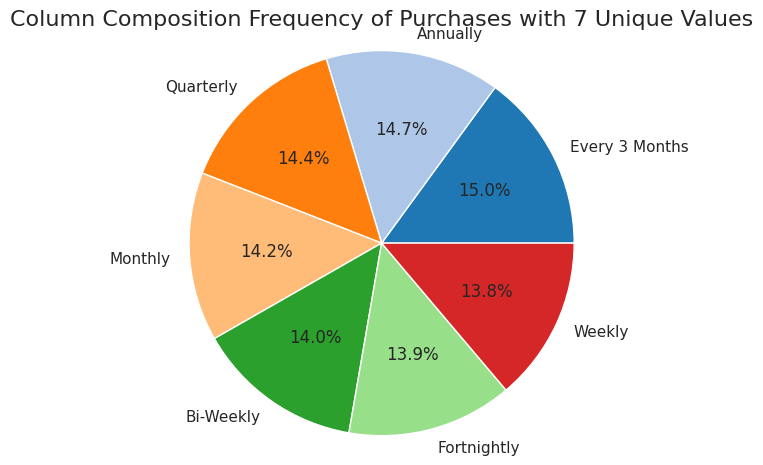

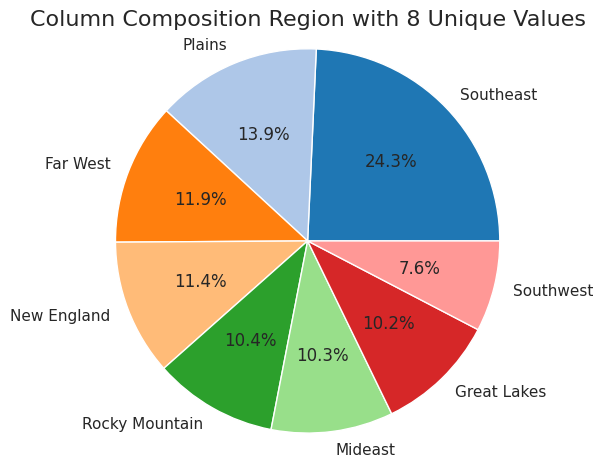

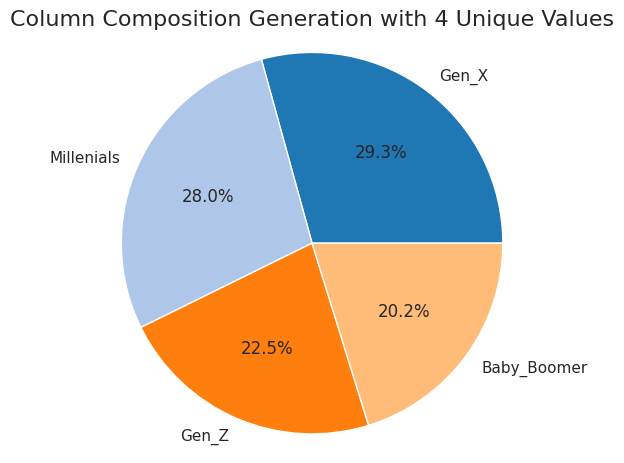

In [42]:
for column in object_columns:
    pie_data = data[column]
    unique_values = len(pie_data.unique())


    value_counts = pie_data.value_counts()


    colors = plt.cm.tab20.colors[:unique_values]


    plt.pie(value_counts, labels=value_counts.index, colors=colors, autopct='%1.1f%%')


    plt.title(f'Column Composition {column} with {unique_values} Unique Values', fontsize=16)
    plt.axis('equal')  
    plt.tight_layout()

    
    plt.show()

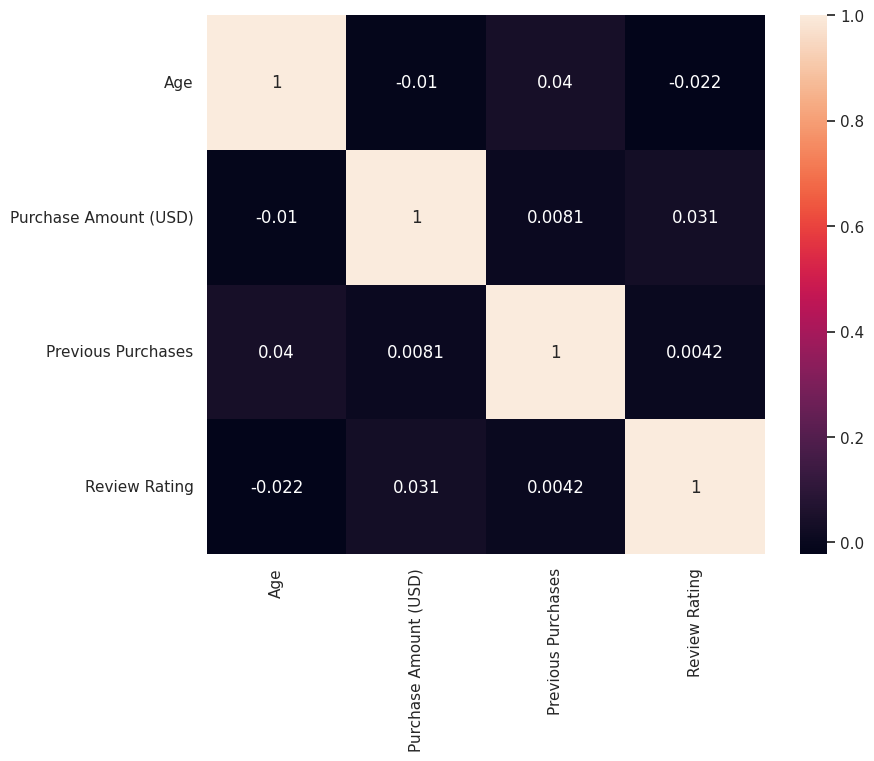

In [43]:
plt.figure(figsize=(9,7))
sns.heatmap(num_data.corr(), annot=True);
plt.show()

In [44]:
scatter_columns = ['Region', 'Generation']

In [45]:
def scatter_plot_hue(y_column):
    for x_column in list(num_data.columns):
        for column in scatter_columns:
            if (x_column != y_column):
                plt.figure(figsize=(12,8))
                sns.scatterplot(data=data, x=x_column, y=y_column, hue=column)
                plt.title(f"Scatter Distribution of {x_column} and {y_column} Based on {column}", fontsize=12)
                plt.show()

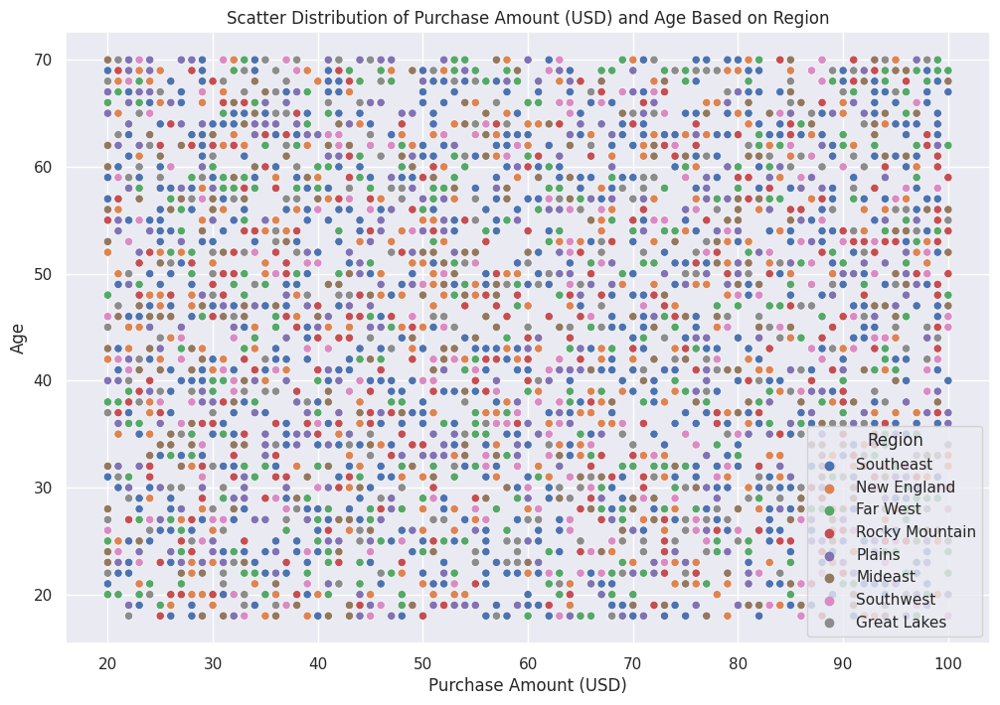

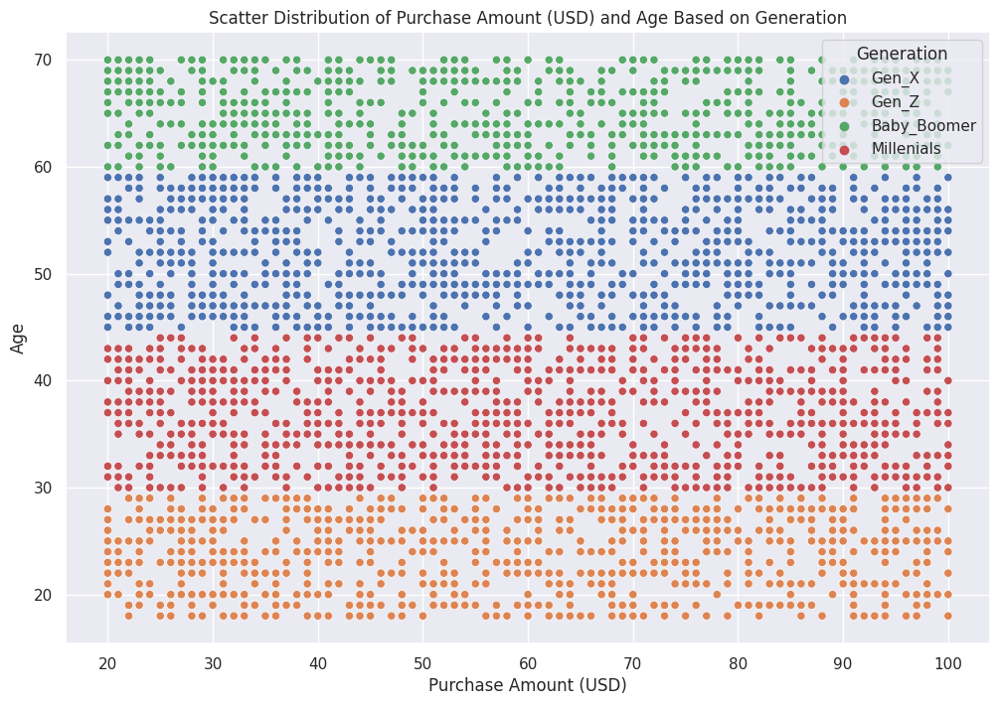

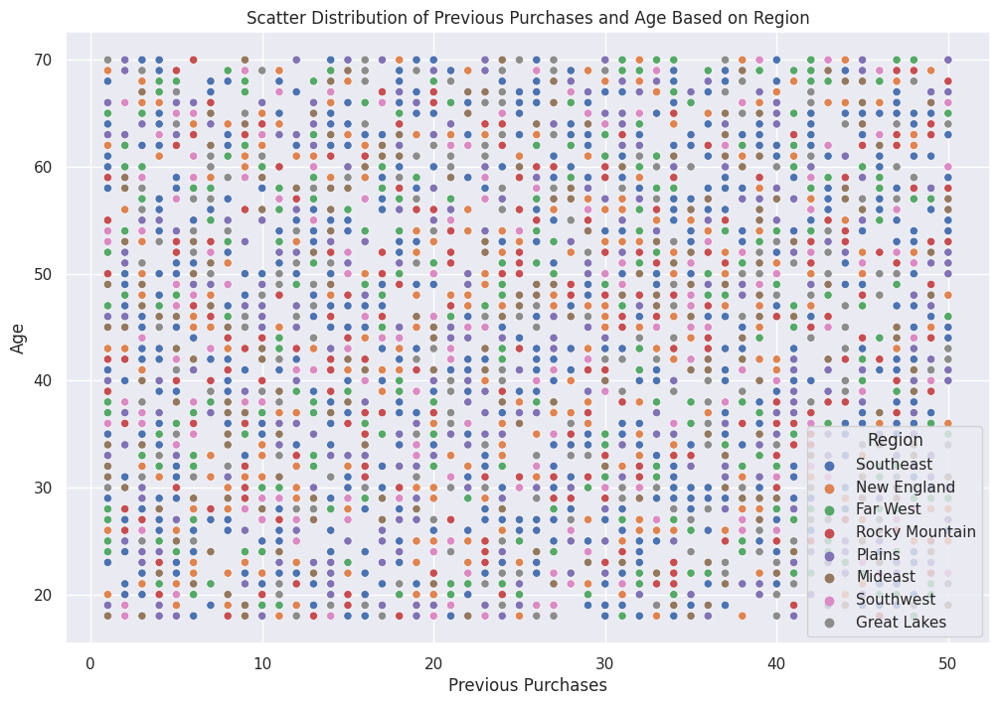

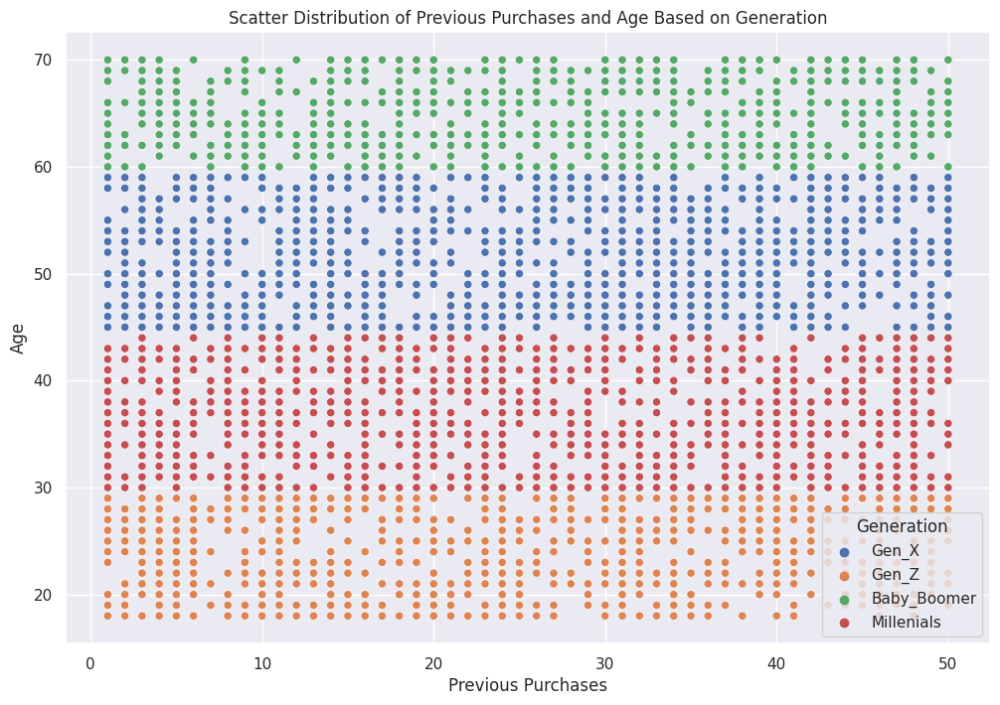

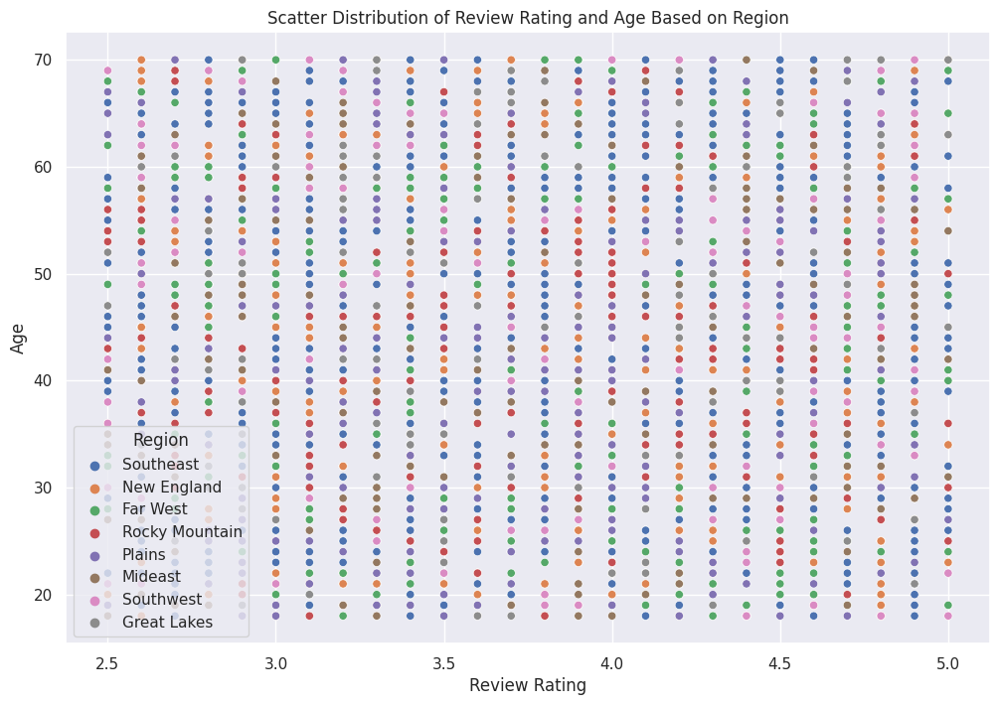

...

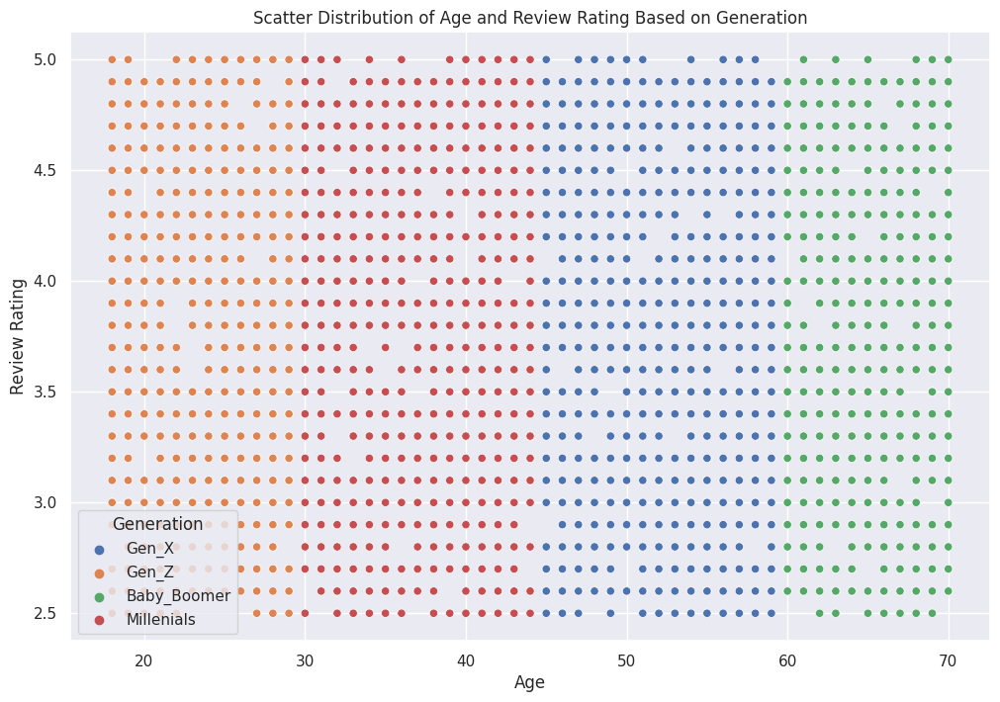

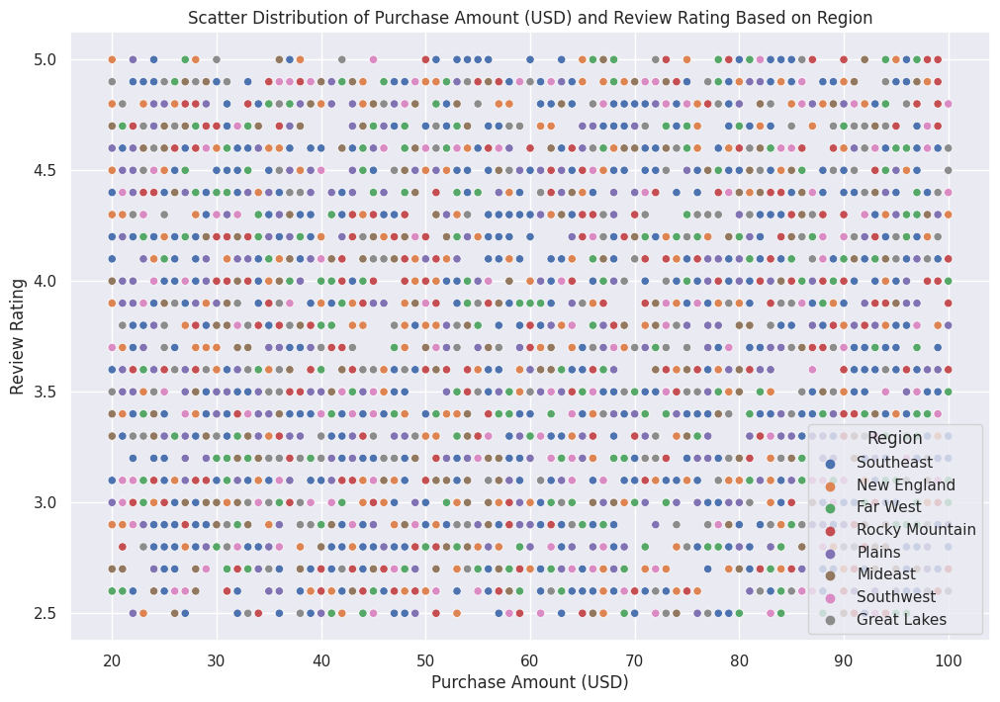

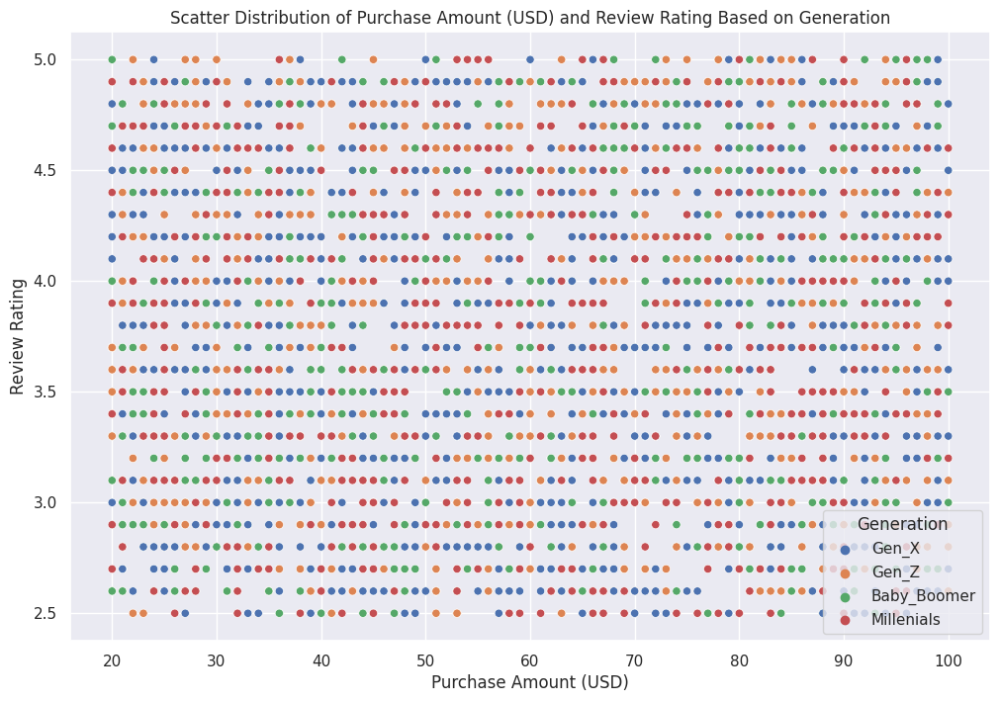

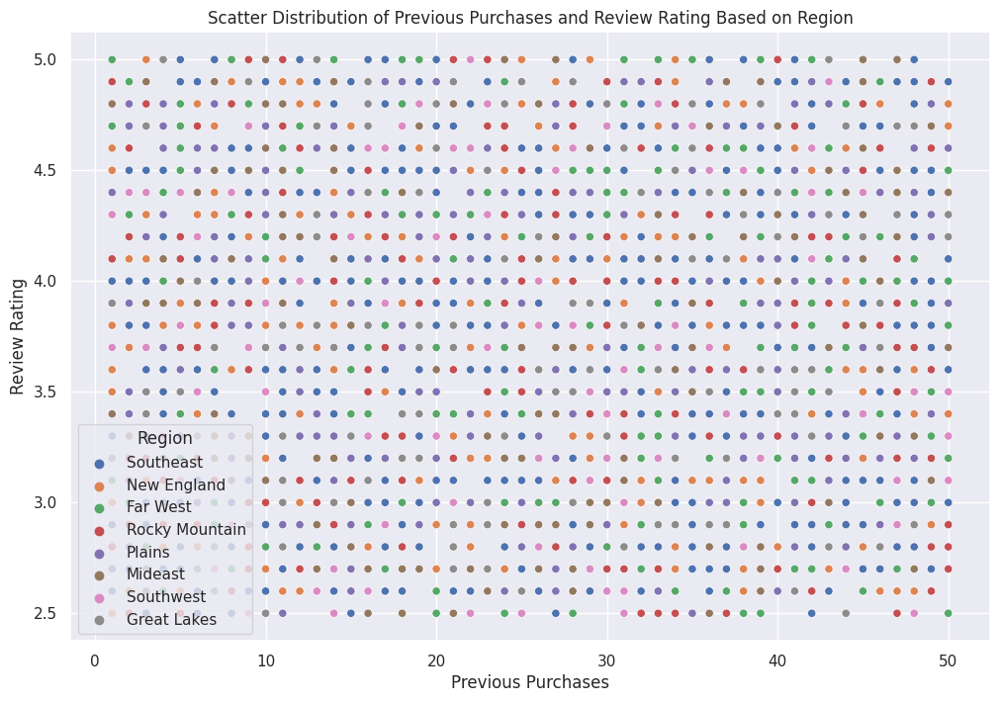

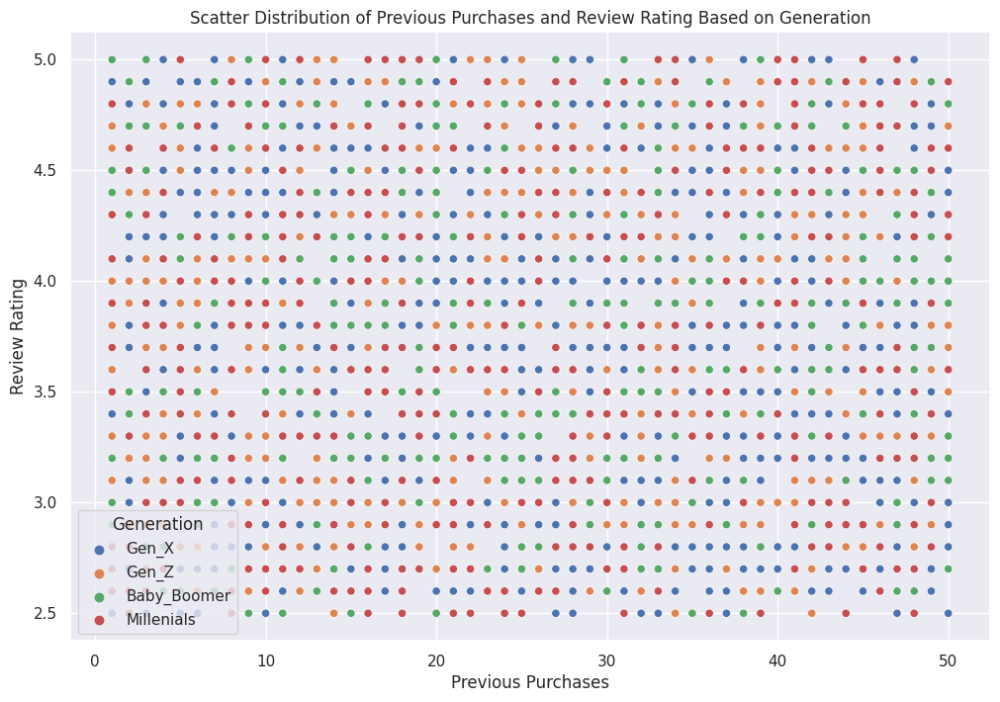

In [46]:
for y_column in num_data.columns:
    scatter_plot_hue(y_column)

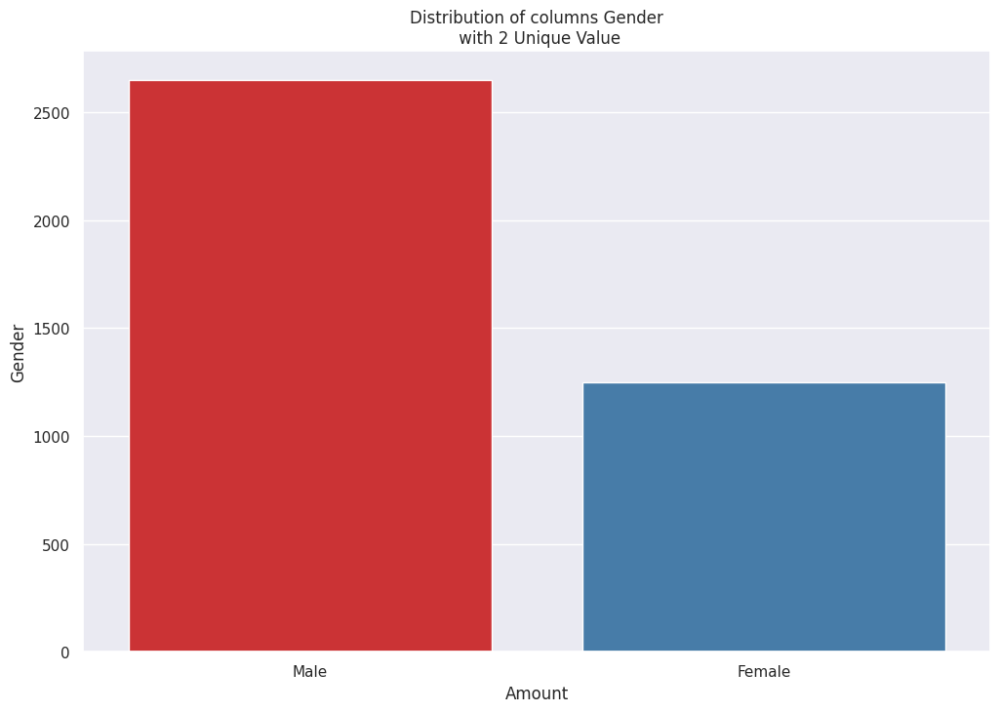

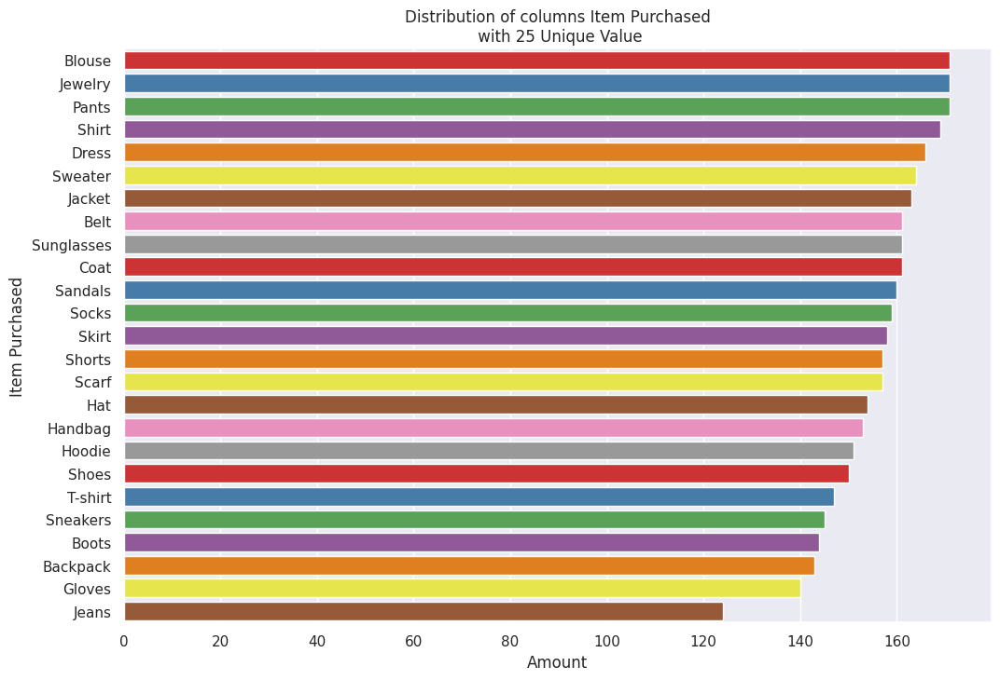

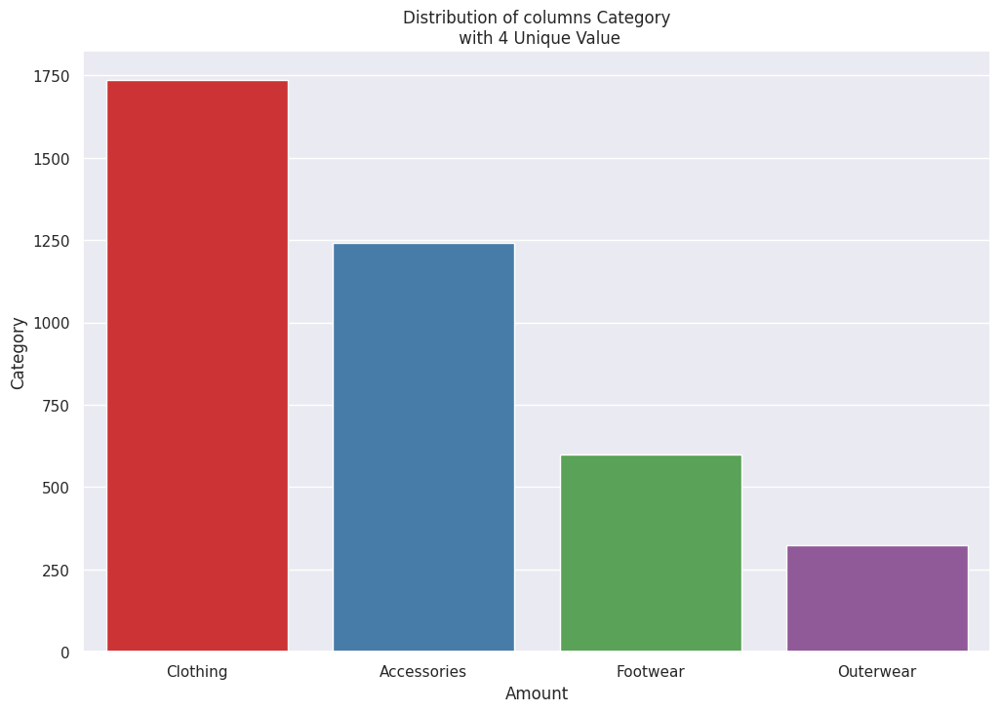

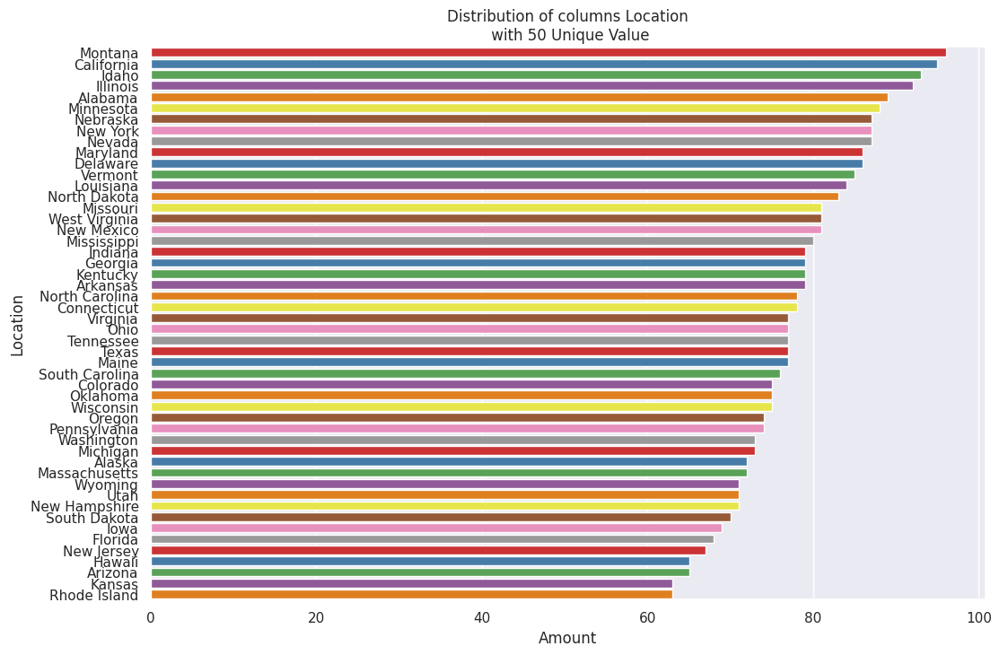

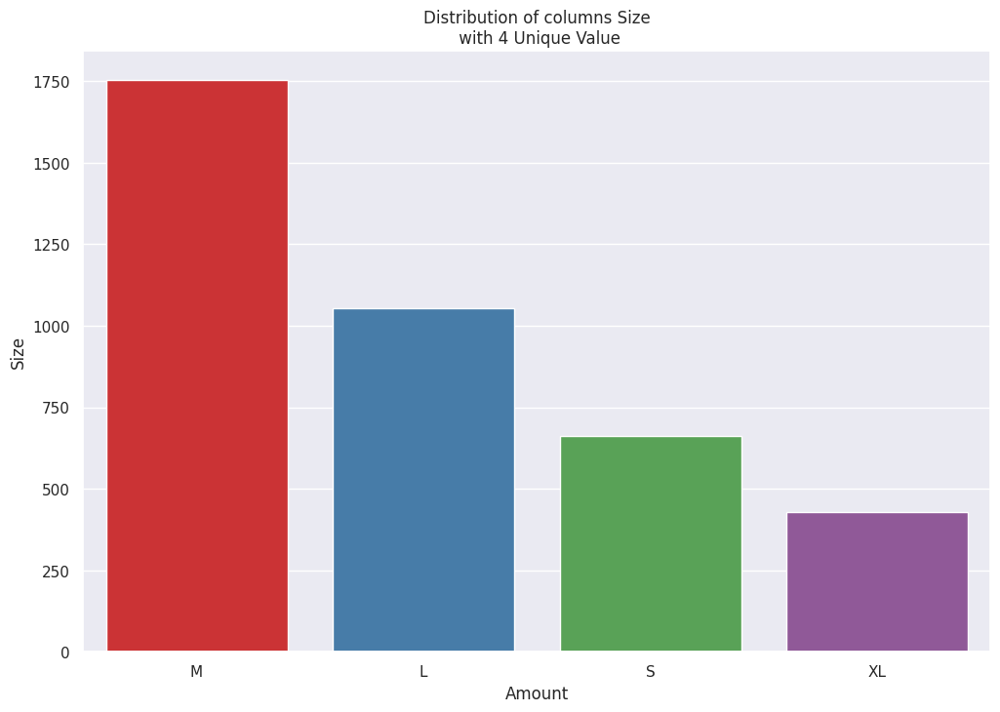

...

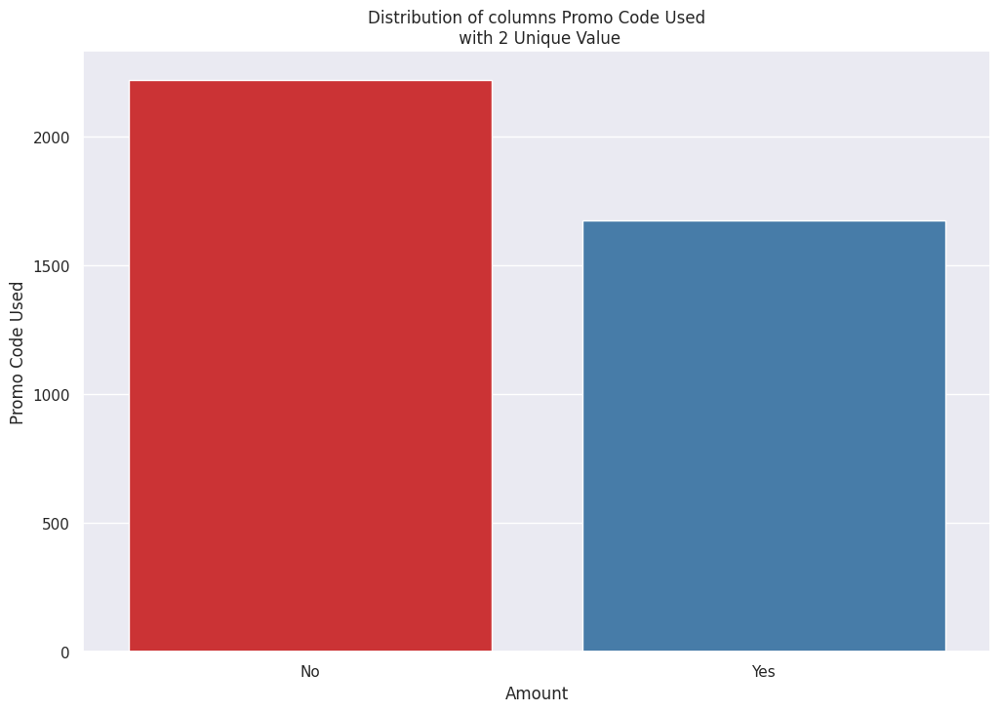

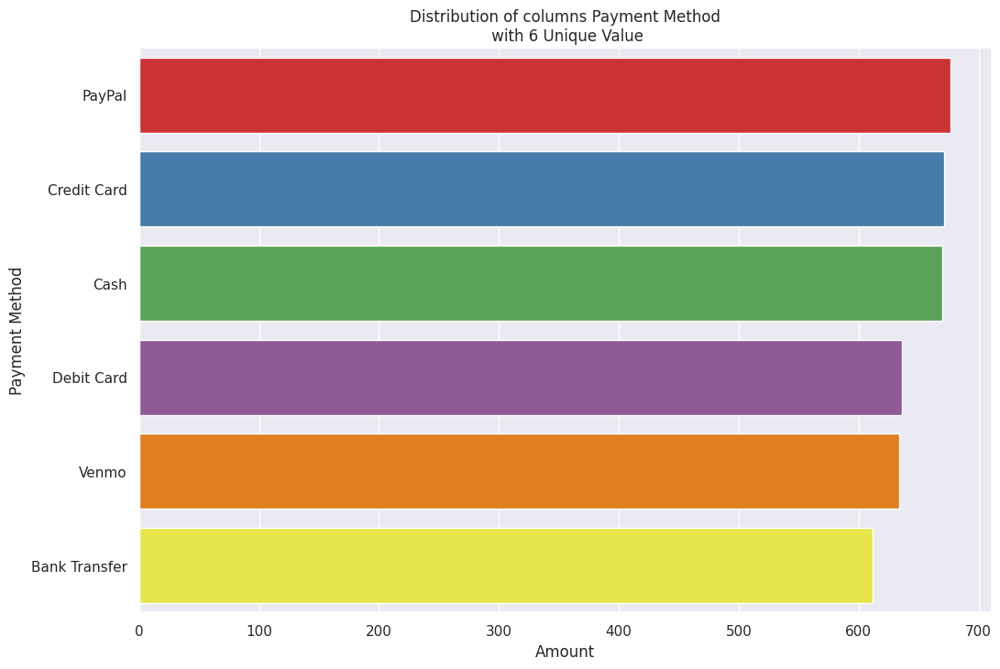

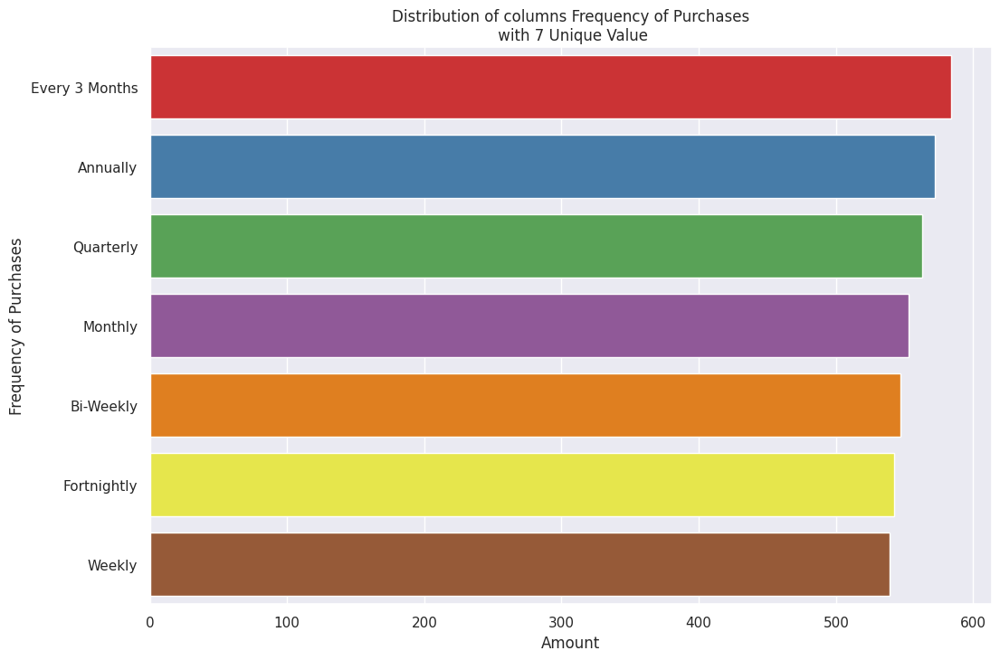

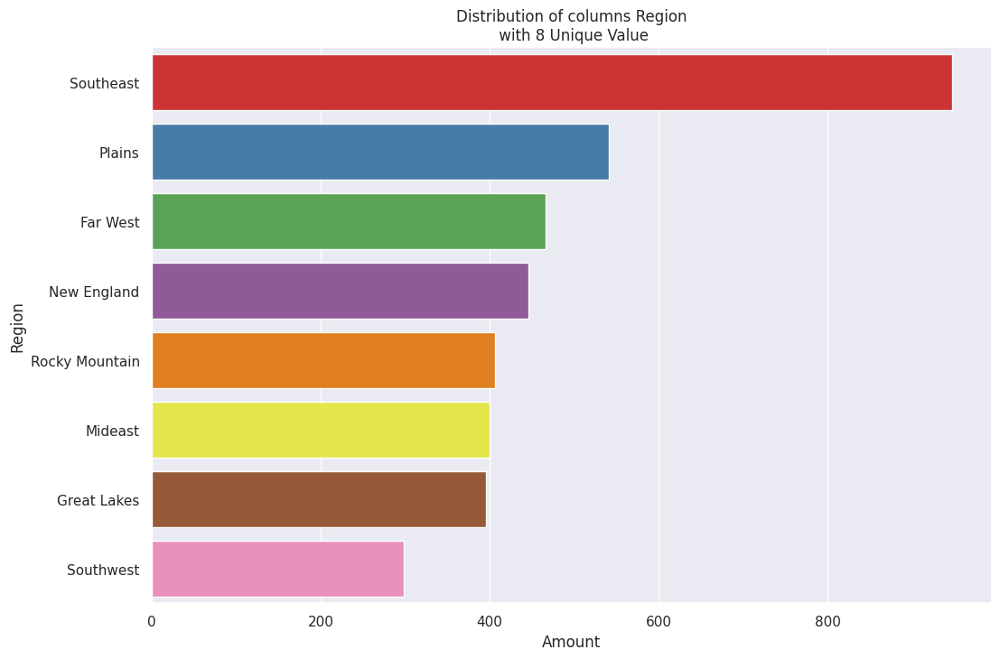

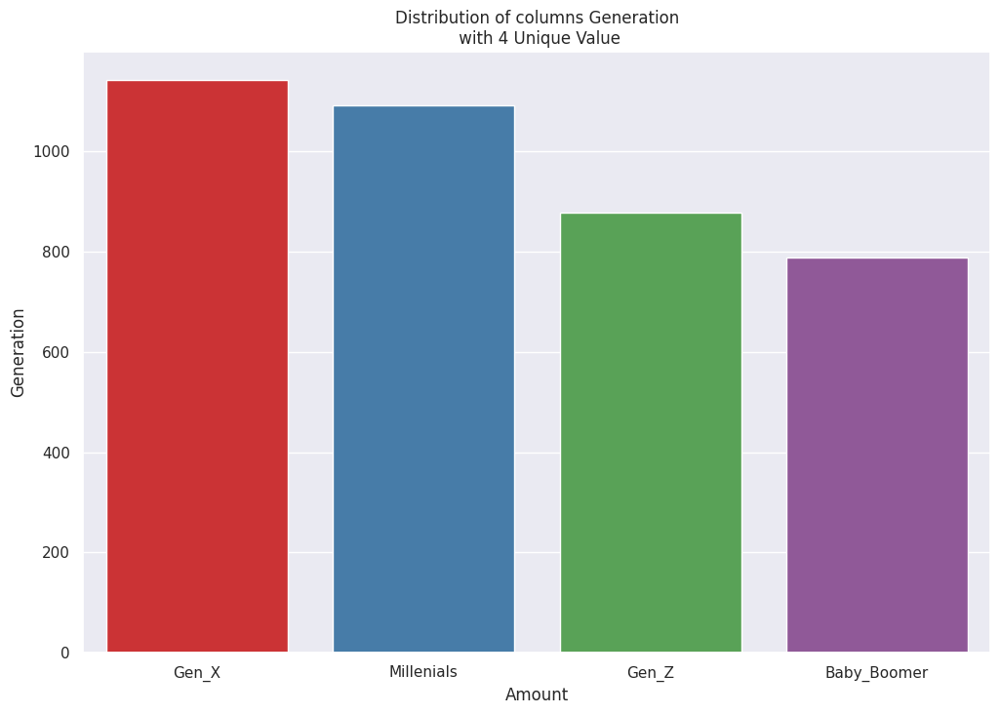

In [47]:
for column in object_columns:
    plt.figure(figsize=(12, 8))

  
    order = data[column].value_counts().index
    
    if len(data[column].unique()) > 5:
        ax = sns.countplot(y=column, data=data, order=order, palette="Set1")
    else:
        ax = sns.countplot(x=column, data=data, order=order, palette="Set1")

    plt.title(f'Distribution of columns {column}\n with {data[column].nunique()} Unique Value')
    plt.xlabel('Amount')
    plt.ylabel(column)

    plt.show()

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-l

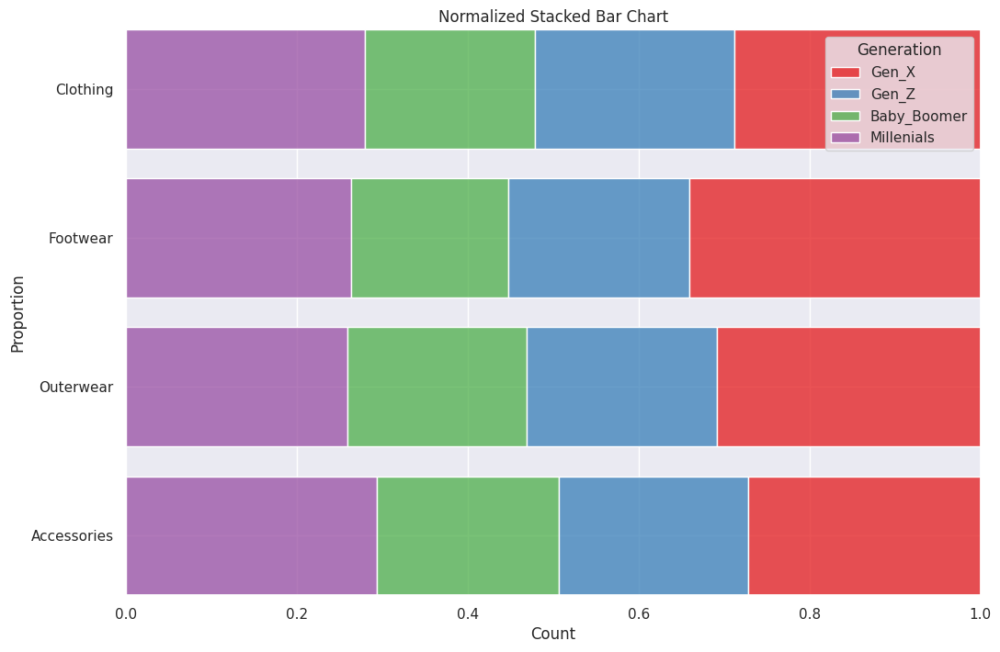

In [48]:
plt.figure(figsize=(12, 8))
sns.histplot(
    data=data,
    y='Category',
    hue='Generation',
    multiple='fill',
    palette="Set1",
    shrink=0.8
)

plt.title('Normalized Stacked Bar Chart')
plt.ylabel('Proportion') 
plt.show()

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-l

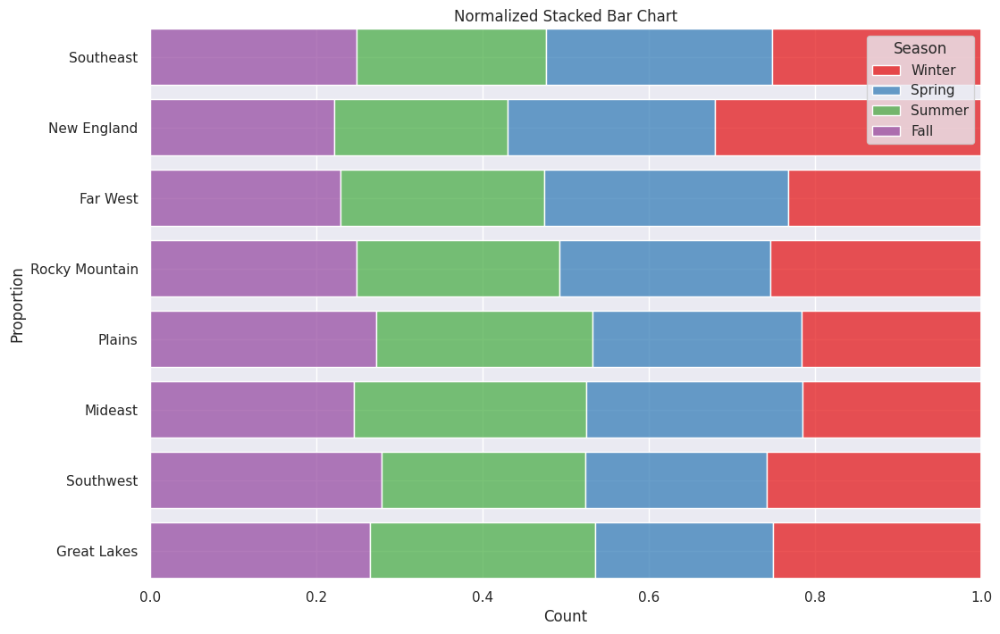

In [49]:
plt.figure(figsize=(12, 8))
sns.histplot(
    data=data,
    y='Region',
    hue='Season',
    multiple='fill',
    palette="Set1",
    shrink=0.8
)

plt.title('Normalized Stacked Bar Chart')
plt.ylabel('Proportion') 
plt.show()

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-l

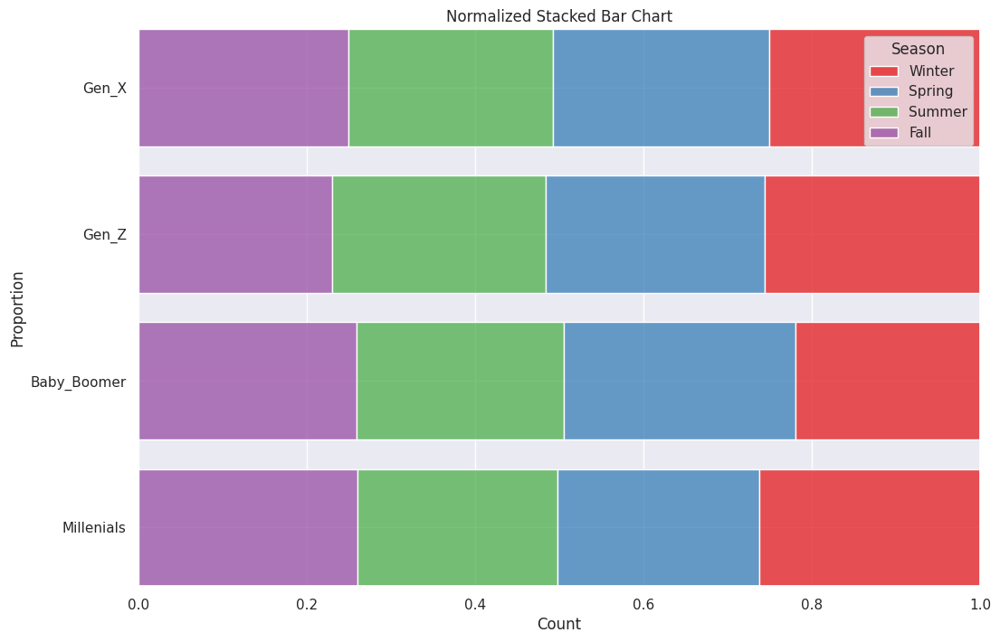

In [50]:
plt.figure(figsize=(12, 8))
sns.histplot(
    data=data,
    y='Generation',
    hue='Season',
    multiple='fill',
    palette="Set1",
    shrink=0.8
)

plt.title('Normalized Stacked Bar Chart')
plt.ylabel('Proportion') 
plt.show()

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-l

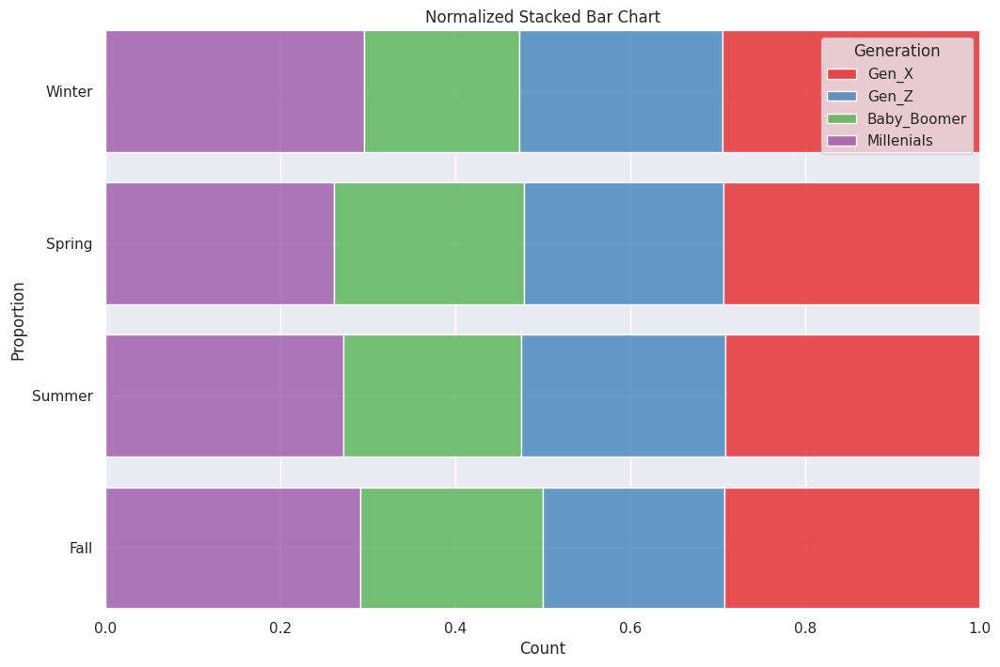

In [51]:
plt.figure(figsize=(12, 8))
sns.histplot(
    data=data,
    y='Season',
    hue='Generation',
    multiple='fill',
    palette="Set1",
    shrink=0.8
)

plt.title('Normalized Stacked Bar Chart')
plt.ylabel('Proportion') 
plt.show()

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-l

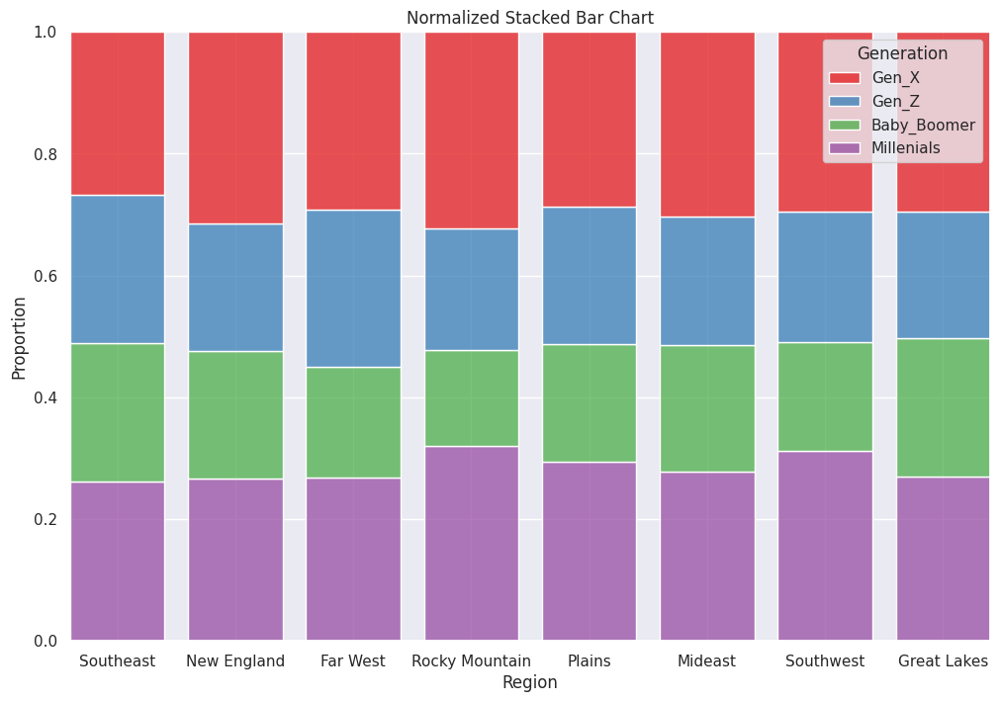

In [52]:
plt.figure(figsize=(12, 8))
sns.histplot(
    data=data,
    x='Region',
    hue='Generation',
    multiple='fill',
    palette="Set1",
    shrink=0.8
)

plt.title('Normalized Stacked Bar Chart')
plt.ylabel('Proportion') 
plt.show()

In [53]:
def drop_column(data, all_columns):
    return data.drop(columns=all_columns)

In [54]:
process_df = drop_column(data.copy(), ["Customer ID", "Color", "Item Purchased", "Location"])
process_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3900 entries, 0 to 3899
Data columns (total 16 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Age                     3900 non-null   int64  
 1   Gender                  3900 non-null   object 
 2   Category                3900 non-null   object 
 3   Purchase Amount (USD)   3900 non-null   int64  
 4   Size                    3900 non-null   object 
 5   Season                  3900 non-null   object 
 6   Review Rating           3900 non-null   float64
 7   Subscription Status     3900 non-null   object 
 8   Shipping Type           3900 non-null   object 
 9   Discount Applied        3900 non-null   object 
 10  Promo Code Used         3900 non-null   object 
 11  Previous Purchases      3900 non-null   int64  
 12  Payment Method          3900 non-null   object 
 13  Frequency of Purchases  3900 non-null   object 
 14  Region                  3900 non-null   

In [55]:
def prep(df):

    df_dummies_reg = pd.get_dummies(df['Region'])
    df_dummies_age = pd.get_dummies(df['Generation'])


    df = pd.concat([df, df_dummies_reg, df_dummies_age], axis=1)


    df.drop(columns=[ 'Region', 'Generation'], axis=1, inplace=True)

    return df

In [56]:
process_df = prep(process_df)
process_df

,Age,Gender,Category,Purchase Amount (USD),Size,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,...,Mideast,New England,Plains,Rocky Mountain,Southeast,Southwest,Baby_Boomer,Gen_X,Gen_Z,Millenials
0,55,Male,Clothing,53,L,Winter,3.1,Yes,Express,Yes,...,False,False,False,False,True,False,False,True,False,False
1,19,Male,Clothing,64,L,Winter,3.1,Yes,Express,Yes,...,False,True,False,False,False,False,False,False,True,False
2,50,Male,Clothing,73,S,Spring,3.1,Yes,Free Shipping,Yes,...,False,True,False,False,False,False,False,True,False,False
3,21,Male,Footwear,90,M,Spring,3.5,Yes,Next Day Air,Yes,...,False,True,False,False,False,False,False,False,True,False
4,45,Male,Clothing,49,M,Spring,2.7,Yes,Free Shipping,Yes,...,False,False,False,False,False,False,False,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3895,40,Female,Clothing,28,L,Summer,4.2,No,2-Day Shipping,No,...,False,False,False,False,True,False,False,False,False,True
3896,52,Female,Accessories,49,L,Spring,4.5,No,Store Pickup,No,...,False,False,True,False,False,False,False,True,False,False
3897,46,Female,Accessories,33,L,Spring,2.9,No,Standard,No,...,True,False,False,False,False,False,False,True,False,False
3898,44,Female,Footwear,77,S,Summer,3.8,No,Express,No,...,False,False,True,False,False,False,False,False,False,True


In [57]:
sep = process_df.iloc[:, 14:]
sep.head()

,Far West,Great Lakes,Mideast,New England,Plains,Rocky Mountain,Southeast,Southwest,Baby_Boomer,Gen_X,Gen_Z,Millenials
0,False,False,False,False,False,False,True,False,False,True,False,False
1,False,False,False,True,False,False,False,False,False,False,True,False
2,False,False,False,True,False,False,False,False,False,True,False,False
3,False,False,False,True,False,False,False,False,False,False,True,False
4,True,False,False,False,False,False,False,False,False,True,False,False


In [58]:
process_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3900 entries, 0 to 3899
Data columns (total 26 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Age                     3900 non-null   int64  
 1   Gender                  3900 non-null   object 
 2   Category                3900 non-null   object 
 3   Purchase Amount (USD)   3900 non-null   int64  
 4   Size                    3900 non-null   object 
 5   Season                  3900 non-null   object 
 6   Review Rating           3900 non-null   float64
 7   Subscription Status     3900 non-null   object 
 8   Shipping Type           3900 non-null   object 
 9   Discount Applied        3900 non-null   object 
 10  Promo Code Used         3900 non-null   object 
 11  Previous Purchases      3900 non-null   int64  
 12  Payment Method          3900 non-null   object 
 13  Frequency of Purchases  3900 non-null   object 
 14  Far West                3900 non-null   

In [59]:
process_df["Frequency of Purchases"].value_counts()

Frequency of Purchases
Every 3 Months    584
Annually          572
Quarterly         563
Monthly           553
Bi-Weekly         547
Fortnightly       542
Weekly            539
Name: count, dtype: int64

In [60]:
category_order = {'Annually':0, 'Every 3 Months':1, 'Monthly':2, 'Quarterly':3, 'Fortnightly':4, 'Weekly':5, 'Bi-Weekly':6}

In [61]:
process_df["Frequency of Purchases"] = process_df["Frequency of Purchases"].map(category_order)

process_df.head()

,Age,Gender,Category,Purchase Amount (USD),Size,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,...,Mideast,New England,Plains,Rocky Mountain,Southeast,Southwest,Baby_Boomer,Gen_X,Gen_Z,Millenials
0,55,Male,Clothing,53,L,Winter,3.1,Yes,Express,Yes,...,False,False,False,False,True,False,False,True,False,False
1,19,Male,Clothing,64,L,Winter,3.1,Yes,Express,Yes,...,False,True,False,False,False,False,False,False,True,False
2,50,Male,Clothing,73,S,Spring,3.1,Yes,Free Shipping,Yes,...,False,True,False,False,False,False,False,True,False,False
3,21,Male,Footwear,90,M,Spring,3.5,Yes,Next Day Air,Yes,...,False,True,False,False,False,False,False,False,True,False
4,45,Male,Clothing,49,M,Spring,2.7,Yes,Free Shipping,Yes,...,False,False,False,False,False,False,False,True,False,False


In [62]:
le = LabelEncoder()

for column in object_columns:
    if column == "Frequency of Purchases" or (column in ["Customer ID", "Color", "Item Purchased", "Location", "Region", "Generation"]):
        continue
    process_df[column] = le.fit_transform(process_df[column])

process_df.head()

,Age,Gender,Category,Purchase Amount (USD),Size,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,...,Mideast,New England,Plains,Rocky Mountain,Southeast,Southwest,Baby_Boomer,Gen_X,Gen_Z,Millenials
0,55,1,1,53,0,3,3.1,1,1,1,...,False,False,False,False,True,False,False,True,False,False
1,19,1,1,64,0,3,3.1,1,1,1,...,False,True,False,False,False,False,False,False,True,False
2,50,1,1,73,2,1,3.1,1,2,1,...,False,True,False,False,False,False,False,True,False,False
3,21,1,2,90,1,1,3.5,1,3,1,...,False,True,False,False,False,False,False,False,True,False
4,45,1,1,49,1,1,2.7,1,2,1,...,False,False,False,False,False,False,False,True,False,False


In [63]:
process_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3900 entries, 0 to 3899
Data columns (total 26 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Age                     3900 non-null   int64  
 1   Gender                  3900 non-null   int64  
 2   Category                3900 non-null   int64  
 3   Purchase Amount (USD)   3900 non-null   int64  
 4   Size                    3900 non-null   int64  
 5   Season                  3900 non-null   int64  
 6   Review Rating           3900 non-null   float64
 7   Subscription Status     3900 non-null   int64  
 8   Shipping Type           3900 non-null   int64  
 9   Discount Applied        3900 non-null   int64  
 10  Promo Code Used         3900 non-null   int64  
 11  Previous Purchases      3900 non-null   int64  
 12  Payment Method          3900 non-null   int64  
 13  Frequency of Purchases  3900 non-null   int64  
 14  Far West                3900 non-null   

In [64]:
X_train = process_df.drop('Age', axis=1)
y_train = process_df['Age']

print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape, "\n")

X_train shape: (3900, 25)
y_train shape: (3900,) 



In [65]:
scaler_ss = StandardScaler()
X_train_ss = pd.DataFrame(scaler_ss.fit_transform(X_train) , columns = X_train.columns)

In [66]:
X_train_ss.head()

,Gender,Category,Purchase Amount (USD),Size,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,Promo Code Used,...,Mideast,New England,Plains,Rocky Mountain,Southeast,Southwest,Baby_Boomer,Gen_X,Gen_Z,Millenials
0,0.685994,-0.002002,-0.285629,-1.203814,1.349198,-0.907584,1.644294,-0.892178,1.151339,1.151339,...,-0.338062,-0.359341,-0.401323,-0.34088,1.765862,-0.287631,-0.503203,1.554047,-0.539014,-0.62361
1,0.685994,-0.002002,0.178852,-1.203814,1.349198,-0.907584,1.644294,-0.892178,1.151339,1.151339,...,-0.338062,2.782875,-0.401323,-0.34088,-0.566296,-0.287631,-0.503203,-0.643481,1.855239,-0.62361
2,0.685994,-0.002002,0.558882,0.945854,-0.441163,-0.907584,1.644294,-0.303032,1.151339,1.151339,...,-0.338062,2.782875,-0.401323,-0.34088,-0.566296,-0.287631,-0.503203,1.554047,-0.539014,-0.62361
3,0.685994,1.113356,1.276716,-0.128980,-0.441163,-0.349027,1.644294,0.286113,1.151339,1.151339,...,-0.338062,2.782875,-0.401323,-0.34088,-0.566296,-0.287631,-0.503203,-0.643481,1.855239,-0.62361
4,0.685994,-0.002002,-0.454531,-0.128980,-0.441163,-1.466141,1.644294,-0.303032,1.151339,1.151339,...,-0.338062,-0.359341,-0.401323,-0.34088,-0.566296,-0.287631,-0.503203,1.554047,-0.539014,-0.62361


In [67]:
scaler_mm = MinMaxScaler()
X_train_mm = pd.DataFrame(scaler_mm.fit_transform(X_train) , columns = X_train.columns)

In [68]:
X_train_mm.head()

,Gender,Category,Purchase Amount (USD),Size,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,Promo Code Used,...,Mideast,New England,Plains,Rocky Mountain,Southeast,Southwest,Baby_Boomer,Gen_X,Gen_Z,Millenials
0,1.0,0.333333,0.4125,0.000000,1.000000,0.24,1.0,0.2,1.0,1.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
1,1.0,0.333333,0.5500,0.000000,1.000000,0.24,1.0,0.2,1.0,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,1.0,0.333333,0.6625,0.666667,0.333333,0.24,1.0,0.4,1.0,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,1.0,0.666667,0.8750,0.333333,0.333333,0.40,1.0,0.6,1.0,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,1.0,0.333333,0.3625,0.333333,0.333333,0.08,1.0,0.4,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


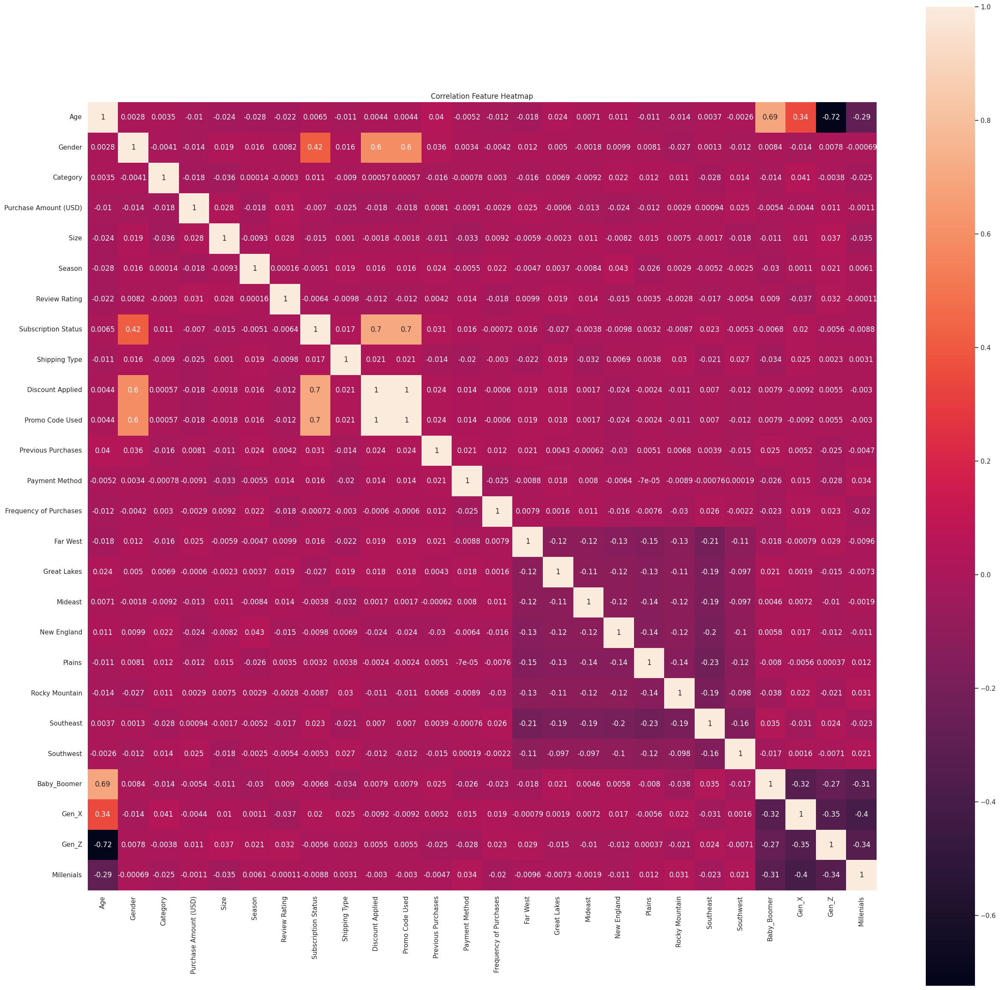

In [69]:
corrmat = process_df.corr(method='pearson')
f, ax = plt.subplots(figsize=(30, 30))
sns.heatmap(corrmat, annot=True, vmax=1, square=True);
plt.title('Correlation Feature Heatmap');
plt.show()

In [70]:
def calculate_inertia(X, k):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X)
    return kmeans.inertia_

def feature_importance_kmeans(X, k):
    baseline_inertia = calculate_inertia(X, k)
    importances = []
    for feature in range(X.shape[1]):
        X_subset = np.delete(X, feature, axis=1)
        inertia = calculate_inertia(X_subset, k)
        importance = baseline_inertia - inertia
        importances.append(importance)
    return importances

/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:8

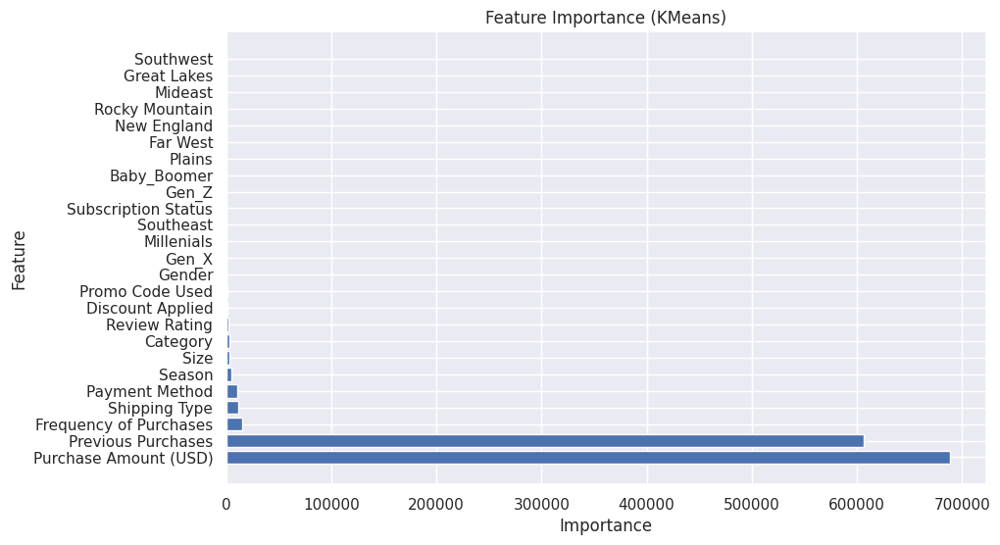

In [71]:
X = X_train.values
k = 4
feature_importances = feature_importance_kmeans(X, k)


importances_df = pd.DataFrame({'Feature': X_train.columns, 'Importance': feature_importances})
importances_df = importances_df.sort_values(by='Importance', ascending=False)


plt.figure(figsize=(10, 6))
plt.barh(importances_df['Feature'], importances_df['Importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importance (KMeans)')
plt.show()

In [72]:

X_process = StandardScaler().fit_transform(num_data)


pca = PCA(n_components=4) 
principalComponents = pca.fit_transform(X_process)


df_pca_nan = pd.DataFrame(data=principalComponents, columns=['PC1', 'PC2', 'PC3', 'P4'])

In [73]:
df_pca_nan

,PC1,PC2,PC3,P4
0,-0.679571,-0.875270,0.614511,0.658878
1,1.410280,-1.771317,0.922706,-0.457249
2,-0.420109,-0.106255,1.059586,0.064985
3,0.587576,1.135377,0.641926,-2.164980
4,-1.097818,-0.705935,0.517618,-0.735760
...,...,...,...,...
3895,-0.218962,-0.258706,-1.510175,-0.286120
3896,-0.472555,1.044618,-1.196806,0.047971
3897,-1.045337,-1.233821,-0.037709,-0.307054
3898,0.349887,0.390339,0.508452,0.100101


In [74]:

loadings_abs = abs(pca.components_)

sorted_indices = loadings_abs.argsort(axis=1)[:, ::-1]

feature_names = num_data.columns

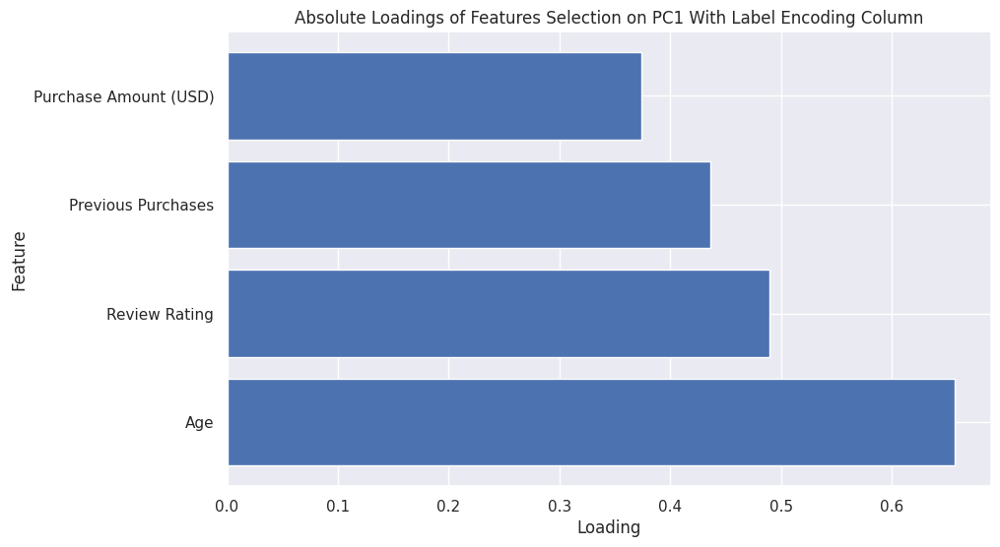

In [75]:

sorted_indices_pc1 = np.argsort(-loadings_abs[0])


plt.figure(figsize=(10, 6))
plt.barh(range(len(feature_names)), loadings_abs[0, sorted_indices_pc1], align='center')
plt.yticks(range(len(feature_names)), [feature_names[i] for i in sorted_indices_pc1])
plt.xlabel('Loading')
plt.ylabel('Feature')
plt.title('Absolute Loadings of Features Selection on PC1 With Label Encoding Column')
plt.show()

In [76]:
chi_data = process_df.copy()
chi_data.nunique()

Age                       53
Gender                     2
Category                   4
Purchase Amount (USD)     81
Size                       4
Season                     4
Review Rating             26
Subscription Status        2
Shipping Type              6
Discount Applied           2
Promo Code Used            2
Previous Purchases        50
Payment Method             6
Frequency of Purchases     7
Far West                   2
Great Lakes                2
Mideast                    2
New England                2
Plains                     2
Rocky Mountain             2
Southeast                  2
Southwest                  2
Baby_Boomer                2
Gen_X                      2
Gen_Z                      2
Millenials                 2
dtype: int64

In [77]:
all = list(chi_data.columns)
all.remove("Age")
all.remove("Purchase Amount (USD)")
all.remove("Previous Purchases")
all.remove("Review Rating")

In [78]:
chi_data.head()

,Age,Gender,Category,Purchase Amount (USD),Size,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,...,Mideast,New England,Plains,Rocky Mountain,Southeast,Southwest,Baby_Boomer,Gen_X,Gen_Z,Millenials
0,55,1,1,53,0,3,3.1,1,1,1,...,False,False,False,False,True,False,False,True,False,False
1,19,1,1,64,0,3,3.1,1,1,1,...,False,True,False,False,False,False,False,False,True,False
2,50,1,1,73,2,1,3.1,1,2,1,...,False,True,False,False,False,False,False,True,False,False
3,21,1,2,90,1,1,3.5,1,3,1,...,False,True,False,False,False,False,False,False,True,False
4,45,1,1,49,1,1,2.7,1,2,1,...,False,False,False,False,False,False,False,True,False,False


In [79]:
X = chi_data[all]
y = chi_data[["Age"]]

In [80]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 42)

In [81]:
f_score = chi2(X_train, y_train)
f_score

(array([  20.47073631,   41.35872829,   47.54386168,   58.4241582 ,
          31.14235209,   47.54939112,   30.54571599,   30.54571599,
          56.47578381,   71.19964645,   58.86713826,   41.40723446,
          44.17677932,   43.17078102,   42.03593423,   53.56630476,
          51.3715991 ,   35.22946224, 2170.        , 1928.        ,
        2116.        , 1976.        ]),
 array([0.99997408, 0.85496143, 0.64958367, 0.25126716, 0.99037572,
        0.64937055, 0.99232699, 0.99232699, 0.31140636, 0.0396751 ,
        0.23867483, 0.85369461, 0.77128569, 0.80341537, 0.83670128,
        0.41397058, 0.49855284, 0.96383857, 0.        , 0.        ,
        0.        , 0.        ]))

In [82]:
pvalues = pd.Series(f_score[1])
pvalues.index = X_train.columns

In [83]:
pvalues = pvalues.sort_values(ascending=True)
pvalues

Millenials                0.000000
Gen_X                     0.000000
Baby_Boomer               0.000000
Gen_Z                     0.000000
Frequency of Purchases    0.039675
Far West                  0.238675
Season                    0.251267
Payment Method            0.311406
Rocky Mountain            0.413971
Southeast                 0.498553
Shipping Type             0.649371
Size                      0.649584
Mideast                   0.771286
New England               0.803415
Plains                    0.836701
Great Lakes               0.853695
Category                  0.854961
Southwest                 0.963839
Subscription Status       0.990376
Discount Applied          0.992327
Promo Code Used           0.992327
Gender                    0.999974
dtype: float64

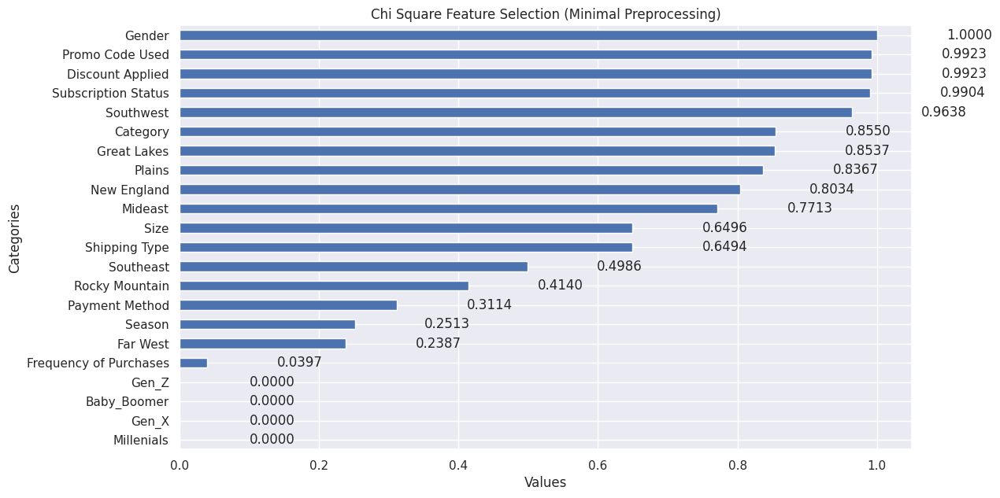

In [84]:
plt.figure(figsize=(12, 7))
ax = pvalues.plot(kind='barh')


for i, v in enumerate(pvalues):
    ax.text(v + 0.1, i, "{:.4f}".format(v), ha='left', va='center')


plt.xlabel('Values')
plt.ylabel('Categories')
plt.title('Chi Square Feature Selection (Minimal Preprocessing)')


plt.show()

In [85]:
column_types = process_df.dtypes
object_columns = column_types[column_types == 'object'].index.tolist()
object_columns

[]

In [86]:
integer_columns = column_types[column_types == 'int64'].index.tolist()
integer_columns

['Age',
 'Gender',
 'Category',
 'Purchase Amount (USD)',
 'Size',
 'Season',
 'Subscription Status',
 'Shipping Type',
 'Discount Applied',
 'Promo Code Used',
 'Previous Purchases',
 'Payment Method',
 'Frequency of Purchases']

In [87]:
float_columns = column_types[column_types == 'float64'].index.tolist()
float_columns

['Review Rating']

In [88]:
clus_score = pd.DataFrame(columns=["Model", "Silhouette Score", "Davies-Bouldin Score", "Calinski-Harabasz Score"])

In [89]:
X_column = 'Age'
y_column = 'Review Rating'

In [90]:
X = process_df[[
    "Gender",
    "Gen_X",
    "Southeast",
    "Category",
    "Size",
    "Age",
    "Review Rating"
]]
X.head()

,Gender,Gen_X,Southeast,Category,Size,Age,Review Rating
0,1,True,True,1,0,55,3.1
1,1,False,False,1,0,19,3.1
2,1,True,False,1,2,50,3.1
3,1,False,False,2,1,21,3.5
4,1,True,False,1,1,45,2.7


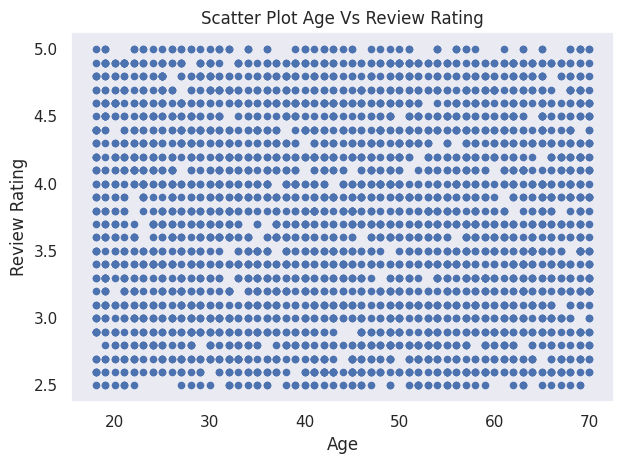

In [91]:
plt.scatter(process_df[X_column],
            process_df[y_column],
            s=20)
plt.grid()
plt.title(f"Scatter Plot {X_column} Vs {y_column}")
plt.xlabel(X_column, fontsize=12)
plt.ylabel(y_column, fontsize=12)
plt.tight_layout()
plt.show()

In [92]:
scaler_ss = StandardScaler()
scaler_ss.fit(X)

X_scaled_ss = pd.DataFrame(scaler_ss.fit_transform(X) , columns = X.columns)
X_scaled_ss

,Gender,Gen_X,Southeast,Category,Size,Age,Review Rating
0,0.685994,1.554047,1.765862,-0.002002,-1.203814,0.718913,-0.907584
1,0.685994,-0.643481,-0.566296,-0.002002,-1.203814,-1.648629,-0.907584
2,0.685994,1.554047,-0.566296,-0.002002,0.945854,0.390088,-0.907584
3,0.685994,-0.643481,-0.566296,1.113356,-0.128980,-1.517099,-0.349027
4,0.685994,1.554047,-0.566296,-0.002002,-0.128980,0.061263,-1.466141
...,...,...,...,...,...,...,...
3895,-1.457738,-0.643481,1.765862,-0.002002,-1.203814,-0.267563,0.628448
3896,-1.457738,1.554047,-0.566296,-1.117360,-1.203814,0.521618,1.047366
3897,-1.457738,1.554047,-0.566296,-1.117360,-1.203814,0.127028,-1.186862
3898,-1.457738,-0.643481,-0.566296,1.113356,0.945854,-0.004502,0.069891


In [93]:
scaler_mm = MinMaxScaler()
scaler_mm.fit(X)

X_scaled_mm = pd.DataFrame(scaler_mm.fit_transform(X) , columns = X.columns)
X_scaled_mm

,Gender,Gen_X,Southeast,Category,Size,Age,Review Rating
0,1.0,1.0,1.0,0.333333,0.000000,0.711538,0.24
1,1.0,0.0,0.0,0.333333,0.000000,0.019231,0.24
2,1.0,1.0,0.0,0.333333,0.666667,0.615385,0.24
3,1.0,0.0,0.0,0.666667,0.333333,0.057692,0.40
4,1.0,1.0,0.0,0.333333,0.333333,0.519231,0.08
...,...,...,...,...,...,...,...
3895,0.0,0.0,1.0,0.333333,0.000000,0.423077,0.68
3896,0.0,1.0,0.0,0.000000,0.000000,0.653846,0.80
3897,0.0,1.0,0.0,0.000000,0.000000,0.538462,0.16
3898,0.0,0.0,0.0,0.666667,0.666667,0.500000,0.52


In [94]:
km_nan = KMeans(n_clusters=4, random_state=0, n_init="auto")
km_nan.fit(X)

y_km_nan = km_nan.predict(X)

In [95]:
def scatter_kmeans(X, y_km, X_column, y_column, km_model, text=""):
    unique_labels = np.unique(y_km)
    for label in unique_labels:

        plt.scatter(X[y_km == label][X_column], X[y_km == label][y_column], label=f'Cluster {label}')
    
 
    centroids = km_model.cluster_centers_
    plt.scatter(centroids[:, X.columns.get_loc(X_column)], centroids[:, X.columns.get_loc(y_column)],
                s=100, marker='*', c='red', edgecolor='black', label='Centroids')

    plt.title(f"Scatter Plot {X_column} Vs {y_column} {text}")
    plt.xlabel(X_column)
    plt.ylabel(y_column)
    plt.legend()
    plt.show()

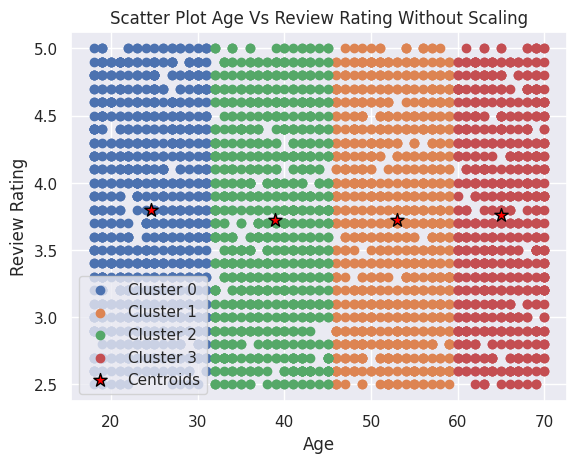

In [96]:
scatter_kmeans(X, y_km_nan, X_column, y_column, km_nan, "Without Scaling")

In [97]:
km_ss = KMeans(n_clusters=4, random_state=0, n_init="auto")
km_ss.fit(X_scaled_ss)

y_km_ss = km_ss.predict(X_scaled_ss)

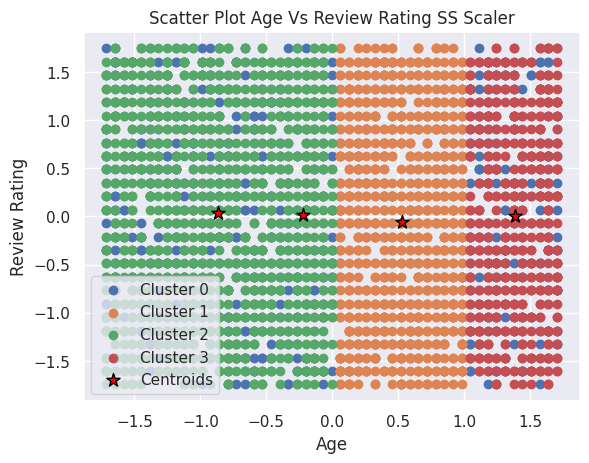

In [98]:
scatter_kmeans(X_scaled_ss, y_km_ss, X_column, y_column, km_ss, "SS Scaler")

In [99]:
km_mm = KMeans(n_clusters=4, random_state=0, n_init="auto")
km_mm.fit(X_scaled_mm)

y_km_mm = km_mm.predict(X_scaled_mm)

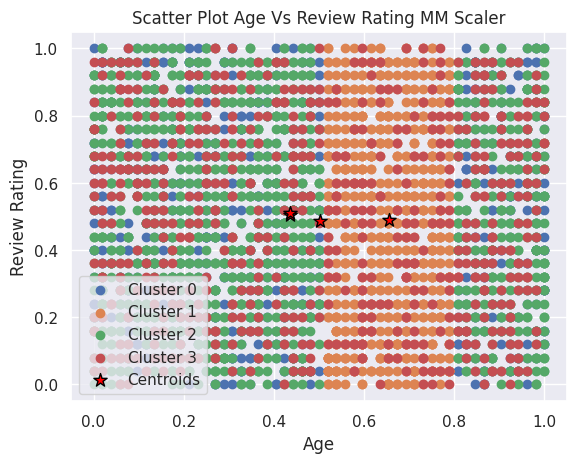

In [100]:
scatter_kmeans(X_scaled_mm, y_km_mm, X_column, y_column, km_mm, "MM Scaler")

In [101]:
def plot_kmeans_distributions(y_km1, y_km2, y_km3, labels):
    fig, axs = plt.subplots(1, 3, figsize=(15, 5), sharey=True)
    
    def add_labels(ax):
        for bar in ax.patches:
            ax.annotate(f'{int(bar.get_height())}', 
                        (bar.get_x() + bar.get_width() / 2, bar.get_height()), 
                        ha='center', va='bottom', 
                        xytext=(0, 5), textcoords='offset points')


    axs[0].hist(y_km1, bins=range(min(y_km1), max(y_km1) + 2))
    axs[0].set_title(f'Cluster Distribution KMeans {labels[0]}')
    axs[0].set_xlabel('Cluster')
    axs[0].set_ylabel('Number of Instances')
    add_labels(axs[0])


    axs[1].hist(y_km2, bins=range(min(y_km2), max(y_km2) + 2))
    axs[1].set_title(f'Cluster Distribution KMeans {labels[1]}')
    axs[1].set_xlabel('Cluster')
    axs[1].set_ylabel('Number of Instances')
    add_labels(axs[1])


    axs[2].hist(y_km3, bins=range(min(y_km3), max(y_km3) + 2))
    axs[2].set_title(f'Cluster Distribution KMeans {labels[2]}')
    axs[2].set_xlabel('Cluster')
    axs[2].set_ylabel('Number of Instances')
    add_labels(axs[2])


    plt.tight_layout()
    plt.show()

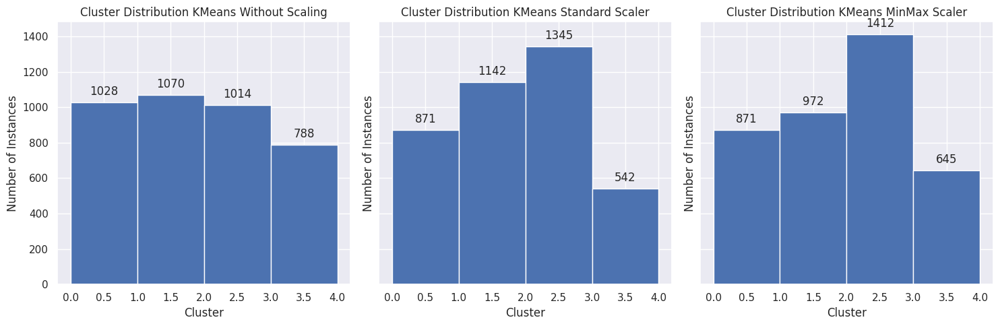

In [102]:
plot_kmeans_distributions(y_km_nan, y_km_ss, y_km_mm, labels=["Without Scaling", "Standard Scaler", "MinMax Scaler"])

In [103]:
cluster_results_kmeans = {
    "Without Scaling": y_km_nan, 
    "Standard Scaler": y_km_ss, 
    "MinMax Scaler": y_km_mm
}

In [104]:
for label, y_km in cluster_results_kmeans.items():
    s_score = silhouette_score(X, y_km)
    db_score = davies_bouldin_score(X, y_km)
    ch_score = calinski_harabasz_score(X, y_km)
    
    new_row = {
        "Model": f"K-Means {label}",
        "Silhouette Score": s_score,
        "Davies-Bouldin Score": db_score,
        "Calinski-Harabasz Score": ch_score
    }
    
    clus_score = pd.concat([clus_score, pd.DataFrame([new_row])], ignore_index=True)

/tmp/ipykernel_17/475964664.py:13: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  clus_score = pd.concat([clus_score, pd.DataFrame([new_row])], ignore_index=True)


In [105]:
clus_score = clus_score.sort_values(by="Silhouette Score", ascending=False)
clus_score

,Model,Silhouette Score,Davies-Bouldin Score,Calinski-Harabasz Score
0,K-Means Without Scaling,0.516945,0.577195,16069.797574
1,K-Means Standard Scaler,0.239753,1.662207,2031.574385
2,K-Means MinMax Scaler,-0.000170,16.321605,142.943793


In [106]:
AC = AgglomerativeClustering(n_clusters=4)
ac_nan = AC.fit(X)

y_pred_nan = AC.fit_predict(X)

In [107]:
ac_ss = AC.fit(X_scaled_ss)

y_pred_ss = AC.fit_predict(X_scaled_ss)

In [108]:
ac_mm = AC.fit(X_scaled_mm)

y_pred_mm = AC.fit_predict(X_scaled_mm)

In [109]:
def scatter_ahc(X, y_km, X_column, y_column, km_model, text=""):
    unique_labels = np.unique(y_km)
    for label in unique_labels:

        plt.scatter(X[y_km == label][X_column], X[y_km == label][y_column], label=f'Cluster {label}')

    plt.title(f"Scatter Plot {X_column} Vs {y_column} {text}")
    plt.xlabel(X_column)
    plt.ylabel(y_column)
    plt.legend()
    plt.show()
    
def plot_ahc_distributions(y_km1, y_km2, y_km3, labels):
    fig, axs = plt.subplots(1, 3, figsize=(18, 6), sharey=True)
    
    def add_labels(ax):
        for bar in ax.patches:
            ax.annotate(f'{int(bar.get_height())}', 
                        (bar.get_x() + bar.get_width() / 2, bar.get_height()), 
                        ha='center', va='bottom', 
                        xytext=(0, 6), textcoords='offset points')


    axs[0].hist(y_km1, bins=range(min(y_km1), max(y_km1) + 2))
    axs[0].set_title(f'Cluster Distribution AHC {labels[0]}')
    axs[0].set_xlabel('Cluster')
    axs[0].set_ylabel('Number of Instances')
    add_labels(axs[0])


    axs[1].hist(y_km2, bins=range(min(y_km2), max(y_km2) + 2))
    axs[1].set_title(f'Cluster Distribution AHC {labels[1]}')
    axs[1].set_xlabel('Cluster')
    axs[1].set_ylabel('Number of Instances')
    add_labels(axs[1])


    axs[2].hist(y_km3, bins=range(min(y_km3), max(y_km3) + 2))
    axs[2].set_title(f'Cluster Distribution AHC {labels[2]}')
    axs[2].set_xlabel('Cluster')
    axs[2].set_ylabel('Number of Instances')
    add_labels(axs[2])


    plt.tight_layout()
    plt.show()

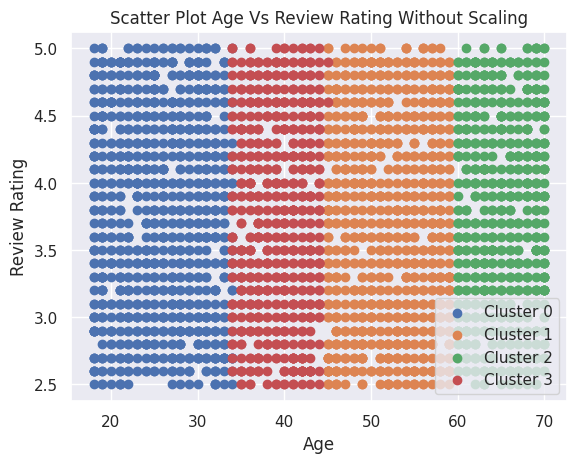

In [110]:
scatter_ahc(X, y_pred_nan, X_column, y_column, ac_nan, "Without Scaling")

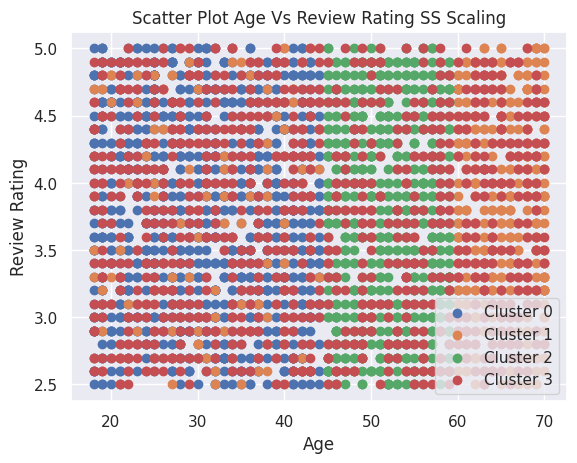

In [111]:
scatter_ahc(X, y_pred_ss, X_column, y_column, ac_ss, "SS Scaling")

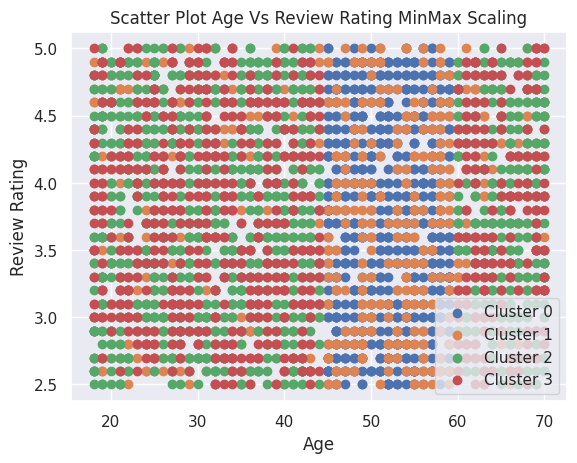

In [112]:
scatter_ahc(X, y_pred_mm, X_column, y_column, ac_mm, "MinMax Scaling")

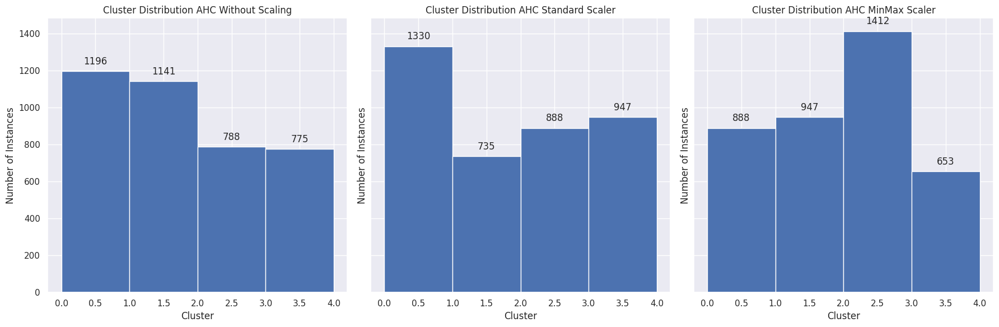

In [113]:
plot_ahc_distributions(y_pred_nan, y_pred_ss, y_pred_mm, labels=["Without Scaling", "Standard Scaler", "MinMax Scaler"])

In [114]:
cluster_results_ahc = {
    "Without Scaling": y_pred_nan, 
    "Standard Scaler": y_pred_ss, 
    "MinMax Scaler": y_pred_mm
}

In [115]:
for label, y_km in cluster_results_ahc.items():
    s_score = silhouette_score(X, y_km)
    db_score = davies_bouldin_score(X, y_km)
    ch_score = calinski_harabasz_score(X, y_km)
    
    new_row = {
        "Model": f"AHC {label}",
        "Silhouette Score": s_score,
        "Davies-Bouldin Score": db_score,
        "Calinski-Harabasz Score": ch_score
    }
    
    clus_score = pd.concat([clus_score, pd.DataFrame([new_row])], ignore_index=True)

In [116]:
clus_score = clus_score.sort_values(by="Silhouette Score", ascending=False)
clus_score

,Model,Silhouette Score,Davies-Bouldin Score,Calinski-Harabasz Score
0,K-Means Without Scaling,0.516945,0.577195,16069.797574
3,AHC Without Scaling,0.498850,0.574814,15115.252079
1,K-Means Standard Scaler,0.239753,1.662207,2031.574385
4,AHC Standard Scaler,0.143282,2.277670,1129.680907
2,K-Means MinMax Scaler,-0.000170,16.321605,142.943793
5,AHC MinMax Scaler,-0.031491,16.482010,130.382423


In [117]:
GMM = GaussianMixture(n_components=4, random_state=42)
GMM_nan = GMM.fit(X)

labels_nan = GMM.fit_predict(X)

In [118]:
GMM_ss = GMM.fit(X_scaled_ss)

labels_ss = GMM.fit_predict(X_scaled_ss)

In [119]:
GMM_mm = GMM.fit(X_scaled_mm)

labels_mm = GMM.fit_predict(X_scaled_mm)

In [120]:
def scatter_gmm(X, y_gmm, X_column, y_column, gmm_model, text=""):
    unique_labels = np.unique(y_gmm)
    for label in unique_labels:

        plt.scatter(X[y_gmm == label][X_column], X[y_gmm == label][y_column], label=f'Cluster {label}')
    

    centroids = gmm_model.means_
    plt.scatter(centroids[:, X.columns.get_loc(X_column)], centroids[:, X.columns.get_loc(y_column)],
                s=100, marker='*', c='red', edgecolor='black', label='Centroids')

    plt.title(f"Scatter Plot {X_column} Vs {y_column} {text}")
    plt.xlabel(X_column)
    plt.ylabel(y_column)
    plt.legend()
    plt.show()
    
def plot_gmm_distributions(y_km1, y_km2, y_km3, labels):
    fig, axs = plt.subplots(1, 3, figsize=(18, 6), sharey=True)
    
    def add_labels(ax):
        for bar in ax.patches:
            ax.annotate(f'{int(bar.get_height())}', 
                        (bar.get_x() + bar.get_width() / 2, bar.get_height()), 
                        ha='center', va='bottom', 
                        xytext=(0, 6), textcoords='offset points')


    axs[0].hist(y_km1, bins=range(min(y_km1), max(y_km1) + 2))
    axs[0].set_title(f'Cluster Distribution GMM {labels[0]}')
    axs[0].set_xlabel('Cluster')
    axs[0].set_ylabel('Number of Instances')
    add_labels(axs[0])


    axs[1].hist(y_km2, bins=range(min(y_km2), max(y_km2) + 2))
    axs[1].set_title(f'Cluster Distribution GMM {labels[1]}')
    axs[1].set_xlabel('Cluster')
    axs[1].set_ylabel('Number of Instances')
    add_labels(axs[1])


    axs[2].hist(y_km3, bins=range(min(y_km3), max(y_km3) + 2))
    axs[2].set_title(f'Cluster Distribution GMM {labels[2]}')
    axs[2].set_xlabel('Cluster')
    axs[2].set_ylabel('Number of Instances')
    add_labels(axs[2])


    plt.tight_layout()
    plt.show()

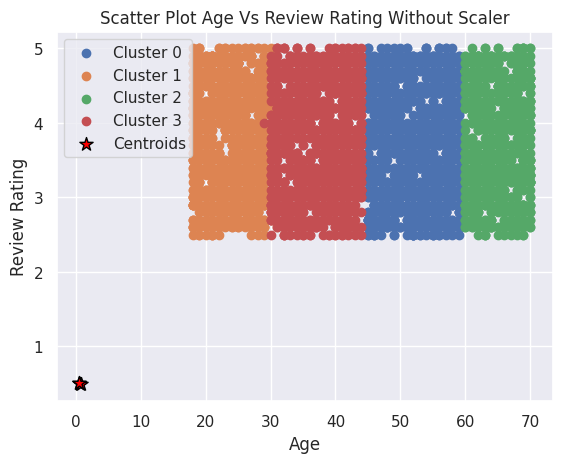

In [121]:
scatter_gmm(X, labels_nan, X_column, y_column, GMM_nan, "Without Scaler")

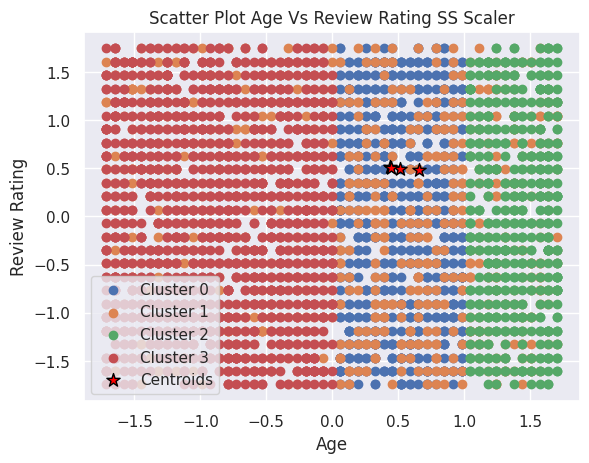

In [122]:
scatter_gmm(X_scaled_ss, labels_ss, X_column, y_column, GMM_ss, "SS Scaler")

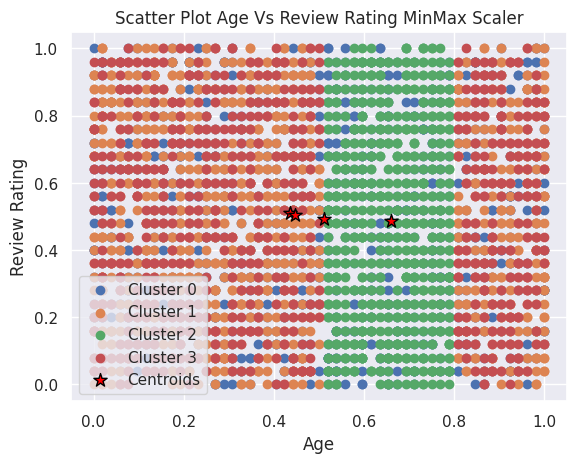

In [123]:
scatter_gmm(X_scaled_mm, labels_mm, X_column, y_column, GMM_mm, "MinMax Scaler")

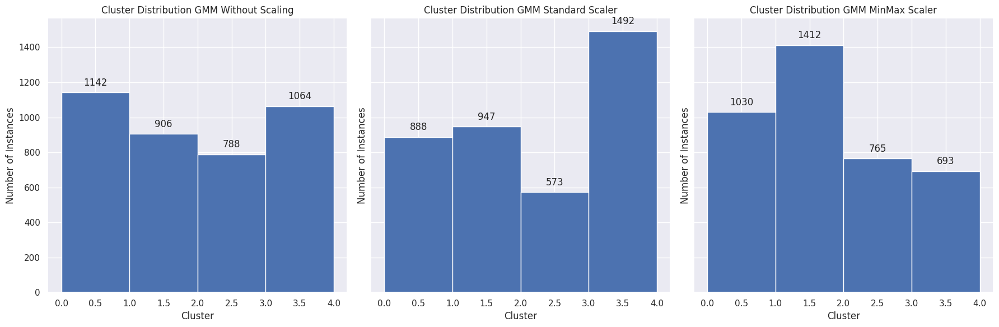

In [124]:
plot_gmm_distributions(labels_nan, labels_ss, labels_mm, labels=["Without Scaling", "Standard Scaler", "MinMax Scaler"])

In [125]:
cluster_results_gmm = {
    "Without Scaling": labels_nan, 
    "Standard Scaler": labels_ss, 
    "MinMax Scaler": labels_mm
}

In [126]:
for label, y_km in cluster_results_gmm.items():
    s_score = silhouette_score(X, y_km)
    db_score = davies_bouldin_score(X, y_km)
    ch_score = calinski_harabasz_score(X, y_km)
    
    new_row = {
        "Model": f"GMM {label}",
        "Silhouette Score": s_score,
        "Davies-Bouldin Score": db_score,
        "Calinski-Harabasz Score": ch_score
    }
    
    clus_score = pd.concat([clus_score, pd.DataFrame([new_row])], ignore_index=True)

In [127]:
clus_score = clus_score.sort_values(by="Silhouette Score", ascending=False)
clus_score

,Model,Silhouette Score,Davies-Bouldin Score,Calinski-Harabasz Score
0,K-Means Without Scaling,0.516945,0.577195,16069.797574
6,GMM Without Scaling,0.510841,0.580357,15714.380655
1,AHC Without Scaling,0.498850,0.574814,15115.252079
2,K-Means Standard Scaler,0.239753,1.662207,2031.574385
7,GMM Standard Scaler,0.220213,1.736543,2070.992317
3,AHC Standard Scaler,0.143282,2.277670,1129.680907
4,K-Means MinMax Scaler,-0.000170,16.321605,142.943793
5,AHC MinMax Scaler,-0.031491,16.482010,130.382423
8,GMM MinMax Scaler,-0.064121,14.795685,119.093600


In [128]:
kmode = KModes(n_clusters=4, init='Cao', verbose=1)
kmode_nan = kmode.fit(X)

kmode_cluster_nan = kmode.predict(X)

Initialization method and algorithm are deterministic. Setting n_init to 1.
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 0, cost: 12647.0


In [129]:
kmode_ss = kmode.fit(X_scaled_ss)

kmode_cluster_ss = kmode.predict(X_scaled_ss)

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 0, cost: 12647.0


In [130]:
kmode_mm = kmode.fit(X_scaled_mm)

kmode_cluster_mm = kmode.predict(X_scaled_mm)

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 0, cost: 12647.0


In [131]:
def scatter_kmode(X, y_km, X_column, y_column, km_model, text=""):
    unique_labels = np.unique(y_km)
    for label in unique_labels:
    
        plt.scatter(X[y_km == label][X_column], X[y_km == label][y_column], label=f'Cluster {label}')
    
    plt.title(f"Scatter Plot {X_column} Vs {y_column} {text}")
    plt.xlabel(X_column)
    plt.ylabel(y_column)
    plt.legend()
    plt.show()
    
def plot_kmode_distributions(y_km1, y_km2, y_km3, labels):
    fig, axs = plt.subplots(1, 3, figsize=(18, 6), sharey=True)
    
    def add_labels(ax):
        for bar in ax.patches:
            ax.annotate(f'{int(bar.get_height())}', 
                        (bar.get_x() + bar.get_width() / 2, bar.get_height()), 
                        ha='center', va='bottom', 
                        xytext=(0, 6), textcoords='offset points')


    axs[0].hist(y_km1, bins=range(min(y_km1), max(y_km1) + 2))
    axs[0].set_title(f'Cluster Distribution K-Mode {labels[0]}')
    axs[0].set_xlabel('Cluster')
    axs[0].set_ylabel('Number of Instances')
    add_labels(axs[0])

 
    axs[1].hist(y_km2, bins=range(min(y_km2), max(y_km2) + 2))
    axs[1].set_title(f'Cluster Distribution K-Mode {labels[1]}')
    axs[1].set_xlabel('Cluster')
    axs[1].set_ylabel('Number of Instances')
    add_labels(axs[1])

    axs[2].hist(y_km3, bins=range(min(y_km3), max(y_km3) + 2))
    axs[2].set_title(f'Cluster Distribution K-Mode {labels[2]}')
    axs[2].set_xlabel('Cluster')
    axs[2].set_ylabel('Number of Instances')
    add_labels(axs[2])


    plt.tight_layout()
    plt.show()

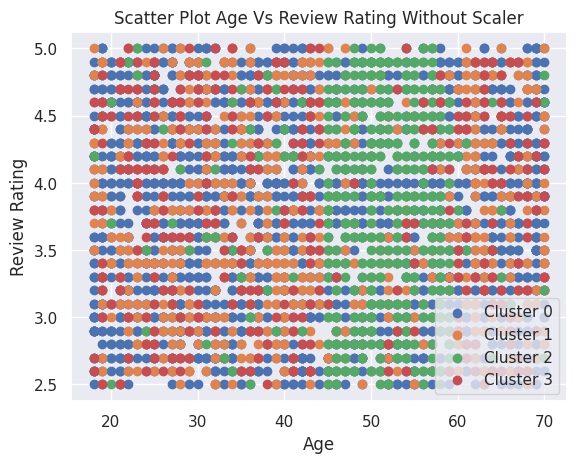

In [132]:
scatter_kmode(X, kmode_cluster_nan, X_column, y_column, kmode_nan, "Without Scaler")

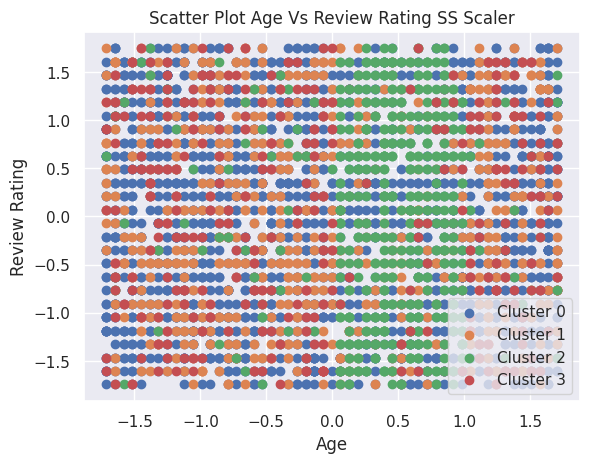

In [133]:
scatter_kmode(X_scaled_ss, kmode_cluster_ss, X_column, y_column, kmode_ss, "SS Scaler")

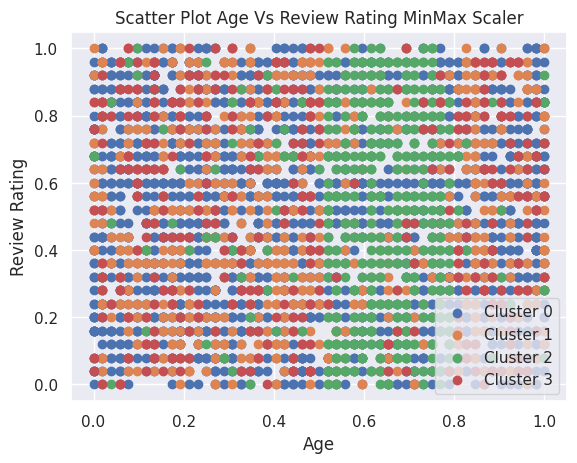

In [134]:
scatter_kmode(X_scaled_mm, kmode_cluster_mm, X_column, y_column, kmode_mm, "MinMax Scaler")

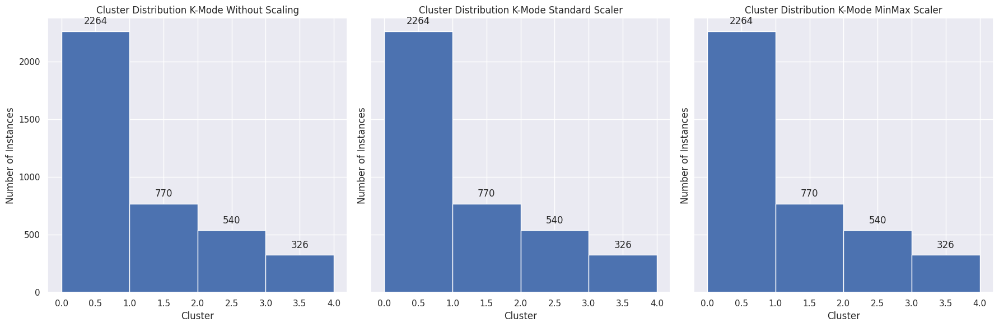

In [135]:
plot_kmode_distributions(kmode_cluster_nan, kmode_cluster_ss, kmode_cluster_mm, labels=["Without Scaling", "Standard Scaler", "MinMax Scaler"])

In [136]:
cluster_results_kmode = {
    "Without Scaling": kmode_cluster_nan, 
    "Standard Scaler": kmode_cluster_ss, 
    "MinMax Scaler": kmode_cluster_mm
}

In [137]:
for label, y_km in cluster_results_kmode.items():
    s_score = silhouette_score(X, y_km, metric='hamming')
    db_score = davies_bouldin_score(X, y_km)
    ch_score = calinski_harabasz_score(X, y_km)
    
    new_row = {
        "Model": f"K-Mode {label}",
        "Silhouette Score": s_score,
        "Davies-Bouldin Score": db_score,
        "Calinski-Harabasz Score": ch_score
    }
    
    clus_score = pd.concat([clus_score, pd.DataFrame([new_row])], ignore_index=True)

In [138]:
clus_score = clus_score.sort_values(by="Silhouette Score", ascending=False)
clus_score

,Model,Silhouette Score,Davies-Bouldin Score,Calinski-Harabasz Score
0,K-Means Without Scaling,0.516945,0.577195,16069.797574
1,GMM Without Scaling,0.510841,0.580357,15714.380655
2,AHC Without Scaling,0.498850,0.574814,15115.252079
3,K-Means Standard Scaler,0.239753,1.662207,2031.574385
4,GMM Standard Scaler,0.220213,1.736543,2070.992317
5,AHC Standard Scaler,0.143282,2.277670,1129.680907
9,K-Mode Without Scaling,0.089748,18.079787,38.273162
10,K-Mode Standard Scaler,0.089748,18.079787,38.273162
11,K-Mode MinMax Scaler,0.089748,18.079787,38.273162
6,K-Means MinMax Scaler,-0.000170,16.321605,142.943793


In [139]:
marketing_df = process_df.copy()
marketing_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3900 entries, 0 to 3899
Data columns (total 26 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Age                     3900 non-null   int64  
 1   Gender                  3900 non-null   int64  
 2   Category                3900 non-null   int64  
 3   Purchase Amount (USD)   3900 non-null   int64  
 4   Size                    3900 non-null   int64  
 5   Season                  3900 non-null   int64  
 6   Review Rating           3900 non-null   float64
 7   Subscription Status     3900 non-null   int64  
 8   Shipping Type           3900 non-null   int64  
 9   Discount Applied        3900 non-null   int64  
 10  Promo Code Used         3900 non-null   int64  
 11  Previous Purchases      3900 non-null   int64  
 12  Payment Method          3900 non-null   int64  
 13  Frequency of Purchases  3900 non-null   int64  
 14  Far West                3900 non-null   

In [140]:
#  ['Gender', 'Category', 'Size', 'Season','Subscription Status', 'Shipping Type', 'Discount Applied',
#                        'Promo Code Used', 'Payment Method', 'Frequency of Purchases', 'Far West', 'Great Lakes', 'Mideast',
#                       'New England', 'Plains', 'Rocky Mountain', 'Southeast', 'Southwest', 'Baby_Boomer', 
#                       'Gen_X', 'Gen_Z', 'Millenials']

categorical_columns = [1, 2, 4, 5, 7, 8, 9, 10, 11, 12, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25]

In [141]:
kproto = KPrototypes(n_clusters=4, verbose=2, max_iter=20)
kproto_clusters = kproto.fit_predict(marketing_df, categorical=categorical_columns)

Initialization method and algorithm are deterministic. Setting n_init to 1.
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 1, iteration: 1/20, moves: 931, ncost: 1022973.8034294427
Run: 1, iteration: 2/20, moves: 451, ncost: 966212.2012314714
Run: 1, iteration: 3/20, moves: 266, ncost: 942281.6343991528
Run: 1, iteration: 4/20, moves: 165, ncost: 934363.6869944617
Run: 1, iteration: 5/20, moves: 94, ncost: 932174.9664770686
Run: 1, iteration: 6/20, moves: 61, ncost: 930984.5519192182
Run: 1, iteration: 7/20, moves: 12, ncost: 930923.9465275934
Run: 1, iteration: 8/20, moves: 1, ncost: 930922.7547255147
Run: 1, iteration: 9/20, moves: 0, ncost: 930922.7547255147
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 2, iteration: 1/20, moves: 693, ncost: 1011793.4079846977
Run: 2, iteration: 2/20, moves: 342, ncost: 986078.5427685985
Run: 2, iteration: 3/20, moves: 243, ncost: 964847.427056145
Run: 2, iteration: 4/20, m

In [142]:
def scatter_kprot(X, y_km, X_column, y_column, km_model, text=""):
    unique_labels = np.unique(y_km)
    for label in unique_labels:
     
        plt.scatter(X[y_km == label][X_column], X[y_km == label][y_column], label=f'Cluster {label}')
    
    plt.title(f"Scatter Plot {X_column} Vs {y_column} {text}")
    plt.xlabel(X_column)
    plt.ylabel(y_column)
    plt.legend()
    plt.show()

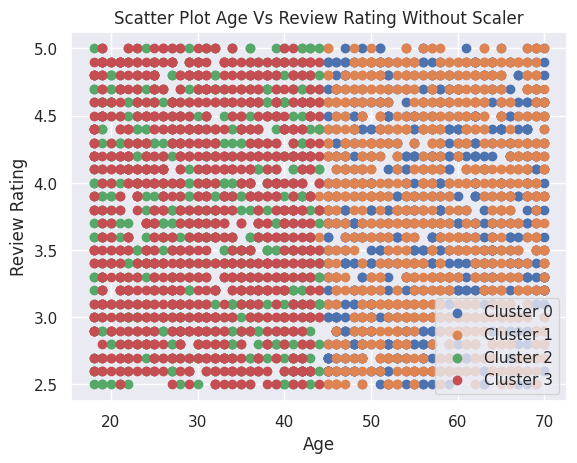

In [143]:
scatter_kprot(marketing_df, kproto_clusters, X_column, y_column, kproto_clusters, "Without Scaler")

In [144]:
marketing_df['cluster'] = kproto_clusters


cluster_counts = marketing_df["cluster"].value_counts()
print(cluster_counts)

cluster
0    992
3    987
2    965
1    956
Name: count, dtype: int64


In [145]:
cluster_results_kproto = {
    "Without Scaling": kproto_clusters, 
}

In [146]:
for label, y_km in cluster_results_kproto.items():
    s_score = silhouette_score(marketing_df, y_km)
    db_score = davies_bouldin_score(marketing_df, y_km)
    ch_score = calinski_harabasz_score(marketing_df, y_km)
    
    new_row = {
        "Model": f"K-Prototypes {label}",
        "Silhouette Score": s_score,
        "Davies-Bouldin Score": db_score,
        "Calinski-Harabasz Score": ch_score
    }
    
    clus_score = pd.concat([clus_score, pd.DataFrame([new_row])], ignore_index=True)

In [147]:
clus_score = clus_score.sort_values(by="Silhouette Score", ascending=False)
clus_score

,Model,Silhouette Score,Davies-Bouldin Score,Calinski-Harabasz Score
0,K-Means Without Scaling,0.516945,0.577195,16069.797574
1,GMM Without Scaling,0.510841,0.580357,15714.380655
2,AHC Without Scaling,0.498850,0.574814,15115.252079
12,K-Prototypes Without Scaling,0.246101,1.478313,1866.396010
3,K-Means Standard Scaler,0.239753,1.662207,2031.574385
4,GMM Standard Scaler,0.220213,1.736543,2070.992317
5,AHC Standard Scaler,0.143282,2.277670,1129.680907
6,K-Mode Without Scaling,0.089748,18.079787,38.273162
7,K-Mode Standard Scaler,0.089748,18.079787,38.273162
8,K-Mode MinMax Scaler,0.089748,18.079787,38.273162


In [148]:
birch = Birch(n_clusters=4)
birch_nan = birch.fit(X)

birch_pred_nan = birch.predict(X)

In [149]:
birch_ss = birch.fit(X_scaled_ss)

birch_pred_ss = birch.predict(X_scaled_ss)

In [150]:
birch_mm = birch.fit(X_scaled_mm)

birch_pred_mm = birch.predict(X_scaled_mm)

In [151]:
def scatter_birch(X, y_km, X_column, y_column, km_model, text=""):
    unique_labels = np.unique(y_km)
    for label in unique_labels:
       
        plt.scatter(X[y_km == label][X_column], X[y_km == label][y_column], label=f'Cluster {label}')
    
    plt.title(f"Scatter Plot {X_column} Vs {y_column} {text}")
    plt.xlabel(X_column)
    plt.ylabel(y_column)
    plt.legend()
    plt.show()
    
def plot_birch_distributions(y_km1, y_km2, y_km3, labels):
    fig, axs = plt.subplots(1, 3, figsize=(18, 6), sharey=True)
    
    def add_labels(ax):
        for bar in ax.patches:
            ax.annotate(f'{int(bar.get_height())}', 
                        (bar.get_x() + bar.get_width() / 2, bar.get_height()), 
                        ha='center', va='bottom', 
                        xytext=(0, 6), textcoords='offset points')


    axs[0].hist(y_km1, bins=range(min(y_km1), max(y_km1) + 2))
    axs[0].set_title(f'Cluster Distribution BIRCH {labels[0]}')
    axs[0].set_xlabel('Cluster')
    axs[0].set_ylabel('Number of Instances')
    add_labels(axs[0])


    axs[1].hist(y_km2, bins=range(min(y_km2), max(y_km2) + 2))
    axs[1].set_title(f'Cluster Distribution BIRCH {labels[1]}')
    axs[1].set_xlabel('Cluster')
    axs[1].set_ylabel('Number of Instances')
    add_labels(axs[1])

    axs[2].hist(y_km3, bins=range(min(y_km3), max(y_km3) + 2))
    axs[2].set_title(f'Cluster Distribution BIRCH {labels[2]}')
    axs[2].set_xlabel('Cluster')
    axs[2].set_ylabel('Number of Instances')
    add_labels(axs[2])


    plt.tight_layout()
    plt.show()

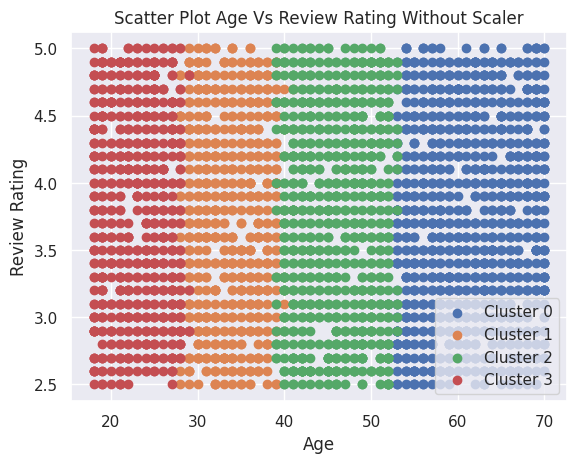

In [152]:
scatter_birch(X, birch_pred_nan, X_column, y_column, birch_nan, "Without Scaler")

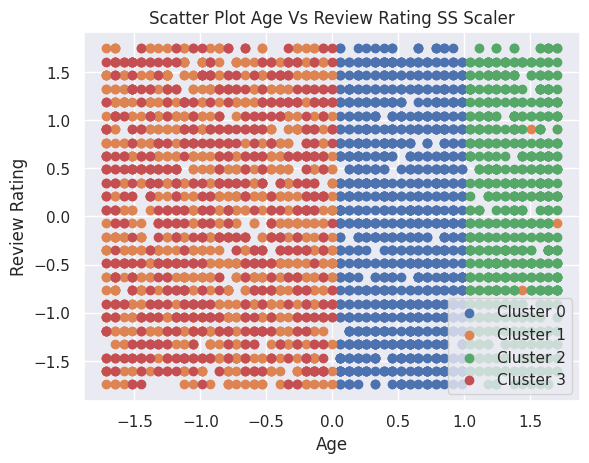

In [153]:
scatter_birch(X_scaled_ss, birch_pred_ss, X_column, y_column, birch_ss, "SS Scaler")

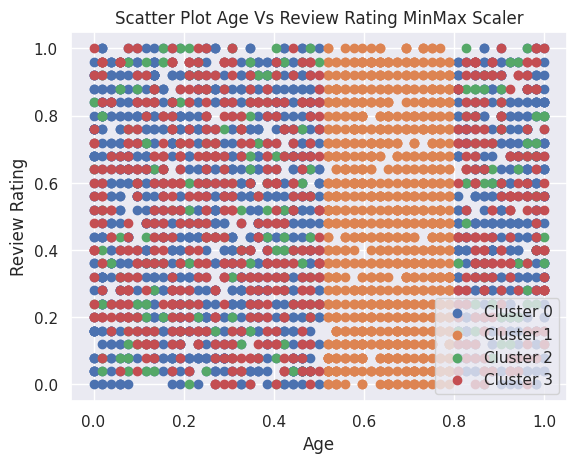

In [154]:
scatter_birch(X_scaled_mm, birch_pred_mm, X_column, y_column, birch_mm, "MinMax Scaler")

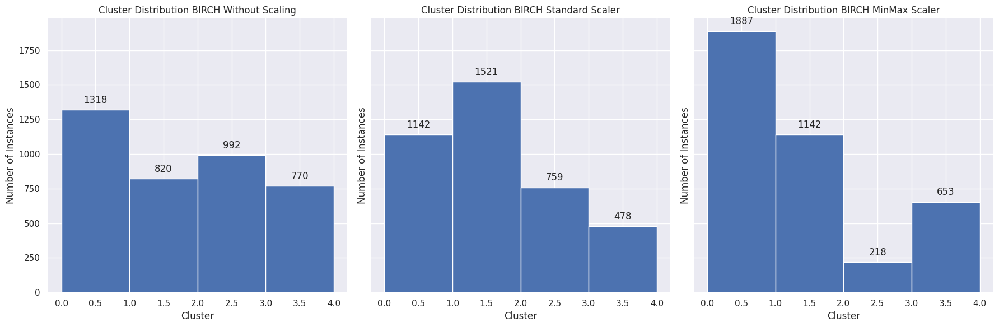

In [155]:
plot_birch_distributions(birch_pred_nan, birch_pred_ss, birch_pred_mm, labels=["Without Scaling", "Standard Scaler", "MinMax Scaler"])

In [156]:
cluster_results_birch = {
    "Without Scaling": birch_pred_nan, 
    "Standard Scaler": birch_pred_ss, 
    "MinMax Scaler": birch_pred_mm
}

In [157]:
for label, y_km in cluster_results_birch.items():
    s_score = silhouette_score(X, y_km)
    db_score = davies_bouldin_score(X, y_km)
    ch_score = calinski_harabasz_score(X, y_km)
    
    new_row = {
        "Model": f"BIRCH {label}",
        "Silhouette Score": s_score,
        "Davies-Bouldin Score": db_score,
        "Calinski-Harabasz Score": ch_score
    }
    
    clus_score = pd.concat([clus_score, pd.DataFrame([new_row])], ignore_index=True)

In [158]:
clus_score = clus_score.sort_values(by="Silhouette Score", ascending=False)
clus_score

,Model,Silhouette Score,Davies-Bouldin Score,Calinski-Harabasz Score
0,K-Means Without Scaling,0.516945,0.577195,16069.797574
1,GMM Without Scaling,0.510841,0.580357,15714.380655
2,AHC Without Scaling,0.498850,0.574814,15115.252079
13,BIRCH Without Scaling,0.497267,0.601729,14024.503133
3,K-Prototypes Without Scaling,0.246101,1.478313,1866.396010
14,BIRCH Standard Scaler,0.243141,4.814522,4972.033642
4,K-Means Standard Scaler,0.239753,1.662207,2031.574385
5,GMM Standard Scaler,0.220213,1.736543,2070.992317
6,AHC Standard Scaler,0.143282,2.277670,1129.680907
7,K-Mode Without Scaling,0.089748,18.079787,38.273162


In [159]:
print(clus_score)

                           Model  Silhouette Score  Davies-Bouldin Score  \
0        K-Means Without Scaling          0.516945              0.577195   
1            GMM Without Scaling          0.510841              0.580357   
2            AHC Without Scaling          0.498850              0.574814   
13         BIRCH Without Scaling          0.497267              0.601729   
3   K-Prototypes Without Scaling          0.246101              1.478313   
14         BIRCH Standard Scaler          0.243141              4.814522   
4        K-Means Standard Scaler          0.239753              1.662207   
5            GMM Standard Scaler          0.220213              1.736543   
6            AHC Standard Scaler          0.143282              2.277670   
7         K-Mode Without Scaling          0.089748             18.079787   
8         K-Mode Standard Scaler          0.089748             18.079787   
9           K-Mode MinMax Scaler          0.089748             18.079787   
15          